# `l2hmc`: Example

This notebook will (attempt) to walk through the steps needed to successfully instantiate and "run" an experiment.

For this example, we wish to train the L2HMC sampler for the 2D $U(1)$ lattice gauge model with Wilson action:

$$
S_{\beta}(n) = \beta \sum_{n}\sum_{\mu<\nu}\mathrm{Re}\left[1 - U_{\mu\nu}(n) \right]
$$

This consists of the following steps:
  1. Parse the specified configuration options and instantiate an `ExperimentConfig`
  2. Use this `ExperimentConfig` to instantiate an `Experiment`
  3. Train the `Experiment` via `Experiment.train()`
  4. Evaluate the trained sampler via `Experiment.evaluate(job_type='eval')`
  5. (Optionally) Run generic HMC to compare against, via `Experiment.evaluate(job_type='hmc')`

## Imports

In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES']

'7'

In [2]:
!getconf _NPROCESSORS_ONLN

256


In [3]:
os.environ['OMP_NUM_THREADS'] = '256'

In [4]:
from __future__ import absolute_import, print_function, annotations, division

# automatically detect and reload local changes to modules
%load_ext autoreload
%autoreload 2

# unset verbose TF XLA Flags
!unset TF_XLA_FLAGS
!unset KMP_AFFINITY KMP_SETTINGS

import os

import hydra
import torch
import tensorflow as tf
import numpy as np
    
from l2hmc.main import setup, setup_tensorflow, setup_torch

_ = setup_torch(
    precision='float32',
    seed=1234,
)

_ = setup_tensorflow(
    precision='float32',
)

from hydra.core.global_hydra import GlobalHydra
from l2hmc.utils.rich import print_config

--------------------------------------------------------------------------

  Local host:   thetagpu21
  Local device: mlx5_0
--------------------------------------------------------------------------
Using: float32 precision


In [5]:
import warnings
import logging
from rich.logging import RichHandler

warnings.filterwarnings('always')

log = logging.getLogger()
log.setLevel('INFO')

wblog = logging.getLogger('wandb')
wblog.setLevel('CRITICAL')
from rich.console import Console
console = Console(log_path=False)

handler = RichHandler(
    show_path=False,
    markup=True,
    rich_tracebacks=True,
)
log.handlers = [handler]

# Set some reasonable defaults for `ExperimentConfig`:

**Note**: For the purposes of demonstrating functionality, we only consider a very simple `debug` example here

In [6]:
GlobalHydra.instance().clear()

defaults = [
    'steps.nera=10',
    'steps.nepoch=500',
    'steps.test=2000',
    'steps.print=100',
    'steps.log=25',
]

defaults_u1 = [
    *defaults,
    'dynamics.nchains=2048',
    'dynamics.nleapfrog=5',
    'dynamics.latvolume=[16, 16]',
    'network.units=[16, 16, 16, 16]',
    'annealing_schedule.beta_init=1.0',
    'annealing_schedule.beta_final=5.0',
]

defaults_su3 = [
    *defaults,
    'dynamics=su3',
    'dynamics.nchains=5',
    'steps.nera=0',
    'steps.nepoch=0',
    'dynamics.latvolume=[8, 8, 8, 16]',
    'annealing_schedule.beta_init=0.7796',
    'annealing_schedule.beta_final=0.7796',
]

In [7]:
outputs = {
    'pytorch': {
        'train': {},
        'eval': {},
        'hmc': {},
    },
    'tensorflow': {
        'train': {},
        'eval': {},
        'hmc': {},
    },
}

# Initialize and Build `Experiment` objects:

- The `l2hmc.configs` module provides a function `get_experiment`:

```python
def get_experiment(overrides: list[str]) -> Experiment:
    ...
```

which will:

    1. Load the default options from `conf/config.yaml`
    2. Override the default options with any values provided in `overrides`
    3. Parse these options and build an `ExperimentConfig` which uniquely defines an experiment
    3. Instantiate / return an `Experiment` from the `ExperimentConfig`
    
**Note:** Prior to beginning training, the `Experiment` must be `built` by calling

```python
from l2hmc.configs import get_experiment
>>> experiment = get_experiment(
        overrides=[
            'framework=pytorch',
            ...,
        ],
    )
```

After which, the model can be trained and evaluated via:

```python
>>> train_output = experiment.train()
>>> eval_output = experiment.evaluate(job_type='eval')
>>> hmc_output = experiment.evaluate(job_type='hmc')
```

## PyTorch

In [8]:
import gc
gc.collect()
with torch.no_grad():
    torch.cuda.empty_cache()

In [10]:
from l2hmc.configs import get_experiment

ptExpU1 = get_experiment(
    overrides=[
        *defaults_u1,
        'framework=pytorch',
        'init_wandb=false',
        'init_aim=false',
    ]
)

[10/21/22 09:38:52] INFO     Using horovod for distributed training

/lus/theta-fs0/software/thetagpu/conda/2022-07-01/mconda3/lib/python3.8/site-packages/torch/nn/modules/lazy.py:178: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '
/lus/theta-fs0/software/thetagpu/conda/2022-07-01/mconda3/lib/python3.8/site-packages/torch/nn/modules/lazy.py:178: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '
/lus/theta-fs0/software/thetagpu/conda/2022-07-01/mconda3/lib/python3.8/site-packages/torch/nn/functional.py:1949: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/lus/theta-fs0/software/thetagpu/conda/2022-07-01/mconda3/lib/python3.8/site-packages/torch

/lus/theta-fs0/software/thetagpu/conda/2022-07-01/mconda3/lib/python3.8/site-packages/torch/nn/functional.py:1949: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/lus/theta-fs0/software/thetagpu/conda/2022-07-01/mconda3/lib/python3.8/site-packages/torch/nn/functional.py:1949: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
/lus/theta-fs0/software/thetagpu/conda/2022-07-01/mconda3/lib/python3.8/site-packages/torch/nn/modules/lazy.py:178: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '
/lus/theta-fs0/software/thetagpu/conda/2022-07-01/mconda3/lib/python3.8/site-packages/torch/nn/modules/lazy.py:178: UserWarning: Lazy modules are a new

[10/21/22 09:38:54] WARNING  Using `torch.optim.Adam` optimizer

[10/21/22 09:38:55] INFO     Using horovod for distributed training

In [ ]:
import warnings
import seaborn as sns

warnings.filterwarnings('ignore')

beta = [
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    4.0,
    3.0,
    2.0,
    3.0,
    4.0
]
with sns.plotting_context("talk"):
    outputs['pytorch']['train'] = ptExpU1.train(beta=beta)

─────────────────────────────────────────────── ERA: 0 / 11, BETA: 1.000 ───────────────────────────────────────────────

[10/21/22 11:52:18] INFO     era=0   epoch=0   tstep=5000 dt=2.6041 beta=1.0000              
                             loss=-921.0289 dQsin=2.4311 dQint=5.3447 energy=509.1927        
                             logprob=509.1744 logdet=0.0183 sldf=-0.2251 sldb=0.2258         
                             sld=0.0183 xeps=0.2092 veps=0.1947 acc=0.9950 sumlogdet=0.0007  
                             acc_mask=0.9985 plaqs=0.0001 intQ=-0.1753 sinQ=-0.0085 lr=0.0010

[10/21/22 11:52:42] INFO     era=0   epoch=100 tstep=5100 dt=0.1476 beta=1.0000              
                             loss=-675.1240 dQsin=1.9607 dQint=3.5630 energy=398.5247        
                             logprob=398.5262 logdet=-0.0015 sldf=-0.1314 sldb=0.1302        
                             sld=-0.0015 xeps=0.2178 veps=0.2161 acc=0.9194 sumlogdet=-0.0012
                             acc_mask=0.9116 plaqs=0.4462 intQ=-0.0498 sinQ=-0.0087 lr=0.0010

[10/21/22 11:53:06] INFO     era=0   epoch=200 tstep=5200 dt=0.1484 beta=1.0000              
                             loss=-646.3610 dQsin=1.9678 dQint=3.6211 energy=397.3049        
                             logprob=397.3116 logdet=-0.0067 sldf=-0.0771 sldb=0.0767        
                             sld=-0.0067 xeps=0.2253 veps=0.2242 acc=0.9203 sumlogdet=-0.0003
                             acc_mask=0.9160 plaqs=0.4469 intQ=0.0293 sinQ=0.0232 lr=0.0010

[10/21/22 11:53:31] INFO     era=0   epoch=300 tstep=5300 dt=0.1567 beta=1.0000              
                             loss=-711.9712 dQsin=2.0718 dQint=3.6147 energy=398.1924        
                             logprob=398.1957 logdet=-0.0033 sldf=-0.0400 sldb=0.0402        
                             sld=-0.0033 xeps=0.2299 veps=0.2284 acc=0.9208 sumlogdet=0.0003 
                             acc_mask=0.9253 plaqs=0.4466 intQ=-0.1216 sinQ=-0.0624 lr=0.0010

[10/21/22 11:53:57] INFO     era=0   epoch=400 tstep=5400 dt=0.1550 beta=1.0000              
                             loss=-678.8104 dQsin=1.9963 dQint=3.6880 energy=397.9855        
                             logprob=397.9896 logdet=-0.0041 sldf=-0.0552 sldb=0.0551        
                             sld=-0.0041 xeps=0.2324 veps=0.2311 acc=0.9336 sumlogdet=-0.0000
                             acc_mask=0.9346 plaqs=0.4473 intQ=0.0273 sinQ=0.0379 lr=0.0010

[10/21/22 11:54:20] INFO     Saving took: 0.0010829s

                    INFO     Era 0 took: 127.387s

─────────────────────────────────────────────── ERA: 1 / 11, BETA: 1.000 ───────────────────────────────────────────────

[10/21/22 11:54:22] INFO     era=1   epoch=0   tstep=5500 dt=0.1560 beta=1.0000              
                             loss=-684.2162 dQsin=2.0153 dQint=3.6128 energy=398.0612        
                             logprob=398.0656 logdet=-0.0045 sldf=-0.0562 sldb=0.0565        
                             sld=-0.0045 xeps=0.2339 veps=0.2325 acc=0.9342 sumlogdet=0.0003 
                             acc_mask=0.9336 plaqs=0.4465 intQ=-0.1255 sinQ=-0.0547 lr=0.0010

[10/21/22 11:54:48] INFO     era=1   epoch=100 tstep=5600 dt=0.1589 beta=1.0000              
                             loss=-682.7421 dQsin=2.0127 dQint=3.6309 energy=398.5958        
                             logprob=398.6009 logdet=-0.0050 sldf=-0.0563 sldb=0.0560        
                             sld=-0.0050 xeps=0.2345 veps=0.2328 acc=0.9309 sumlogdet=-0.0002
                             acc_mask=0.9355 plaqs=0.4468 intQ=-0.0698 sinQ=-0.0657 lr=0.0010

[10/21/22 11:55:14] INFO     era=1   epoch=200 tstep=5700 dt=0.1575 beta=1.0000              
                             loss=-693.0221 dQsin=2.0459 dQint=3.6899 energy=398.0157        
                             logprob=398.0197 logdet=-0.0040 sldf=-0.0481 sldb=0.0487        
                             sld=-0.0040 xeps=0.2350 veps=0.2333 acc=0.9345 sumlogdet=0.0003 
                             acc_mask=0.9365 plaqs=0.4482 intQ=0.0576 sinQ=0.0425 lr=0.0010

[10/21/22 11:55:39] INFO     era=1   epoch=300 tstep=5800 dt=0.1586 beta=1.0000              
                             loss=-697.9917 dQsin=2.0182 dQint=3.6792 energy=397.9626        
                             logprob=397.9671 logdet=-0.0045 sldf=-0.0575 sldb=0.0577        
                             sld=-0.0045 xeps=0.2351 veps=0.2341 acc=0.9356 sumlogdet=0.0002 
                             acc_mask=0.9292 plaqs=0.4455 intQ=-0.0059 sinQ=-0.0125 lr=0.0010

[10/21/22 11:56:05] INFO     era=1   epoch=400 tstep=5900 dt=0.1589 beta=1.0000              
                             loss=-733.2430 dQsin=2.0866 dQint=3.7559 energy=398.0788        
                             logprob=398.0827 logdet=-0.0039 sldf=-0.0475 sldb=0.0473        
                             sld=-0.0039 xeps=0.2359 veps=0.2343 acc=0.9395 sumlogdet=-0.0002
                             acc_mask=0.9385 plaqs=0.4461 intQ=-0.0420 sinQ=-0.0236 lr=0.0010

[10/21/22 11:56:28] INFO     Saving took: 0.00115776s

                    INFO     Era 1 took: 128.512s

                    INFO     Avgs over last era:                                             
                              tstep=3237.5000, dt=0.1516, beta=1.0000, loss=-656.3684,       
                             dQsin=1.9600, dQint=3.5205, energy=398.0865, logprob=398.0655,  
                             logdet=0.0210, sldf=-0.1707, sldb=0.1704, sld=0.0210,           
                             xeps=0.2176, veps=0.2167, acc=0.9169, sumlogdet=-0.0001,        
                             acc_mask=0.9171, plaqs=0.4464, intQ=0.0025, sinQ=-0.0027,       
                             lr=0.0010                                                       
                    

─────────────────────────────────────────────── ERA: 2 / 11, BETA: 1.000 ───────────────────────────────────────────────

[10/21/22 11:56:31] INFO     era=2   epoch=0   tstep=6000 dt=0.2489 beta=1.0000              
                             loss=-687.6559 dQsin=2.0459 dQint=3.7710 energy=398.2425        
                             logprob=398.2451 logdet=-0.0027 sldf=-0.0419 sldb=0.0421        
                             sld=-0.0027 xeps=0.2367 veps=0.2348 acc=0.9366 sumlogdet=0.0003 
                             acc_mask=0.9434 plaqs=0.4466 intQ=-0.0796 sinQ=-0.0076 lr=0.0010

[10/21/22 11:56:56] INFO     era=2   epoch=100 tstep=6100 dt=0.1596 beta=1.0000              
                             loss=-689.0137 dQsin=2.0174 dQint=3.6304 energy=398.9803        
                             logprob=398.9845 logdet=-0.0042 sldf=-0.0543 sldb=0.0542        
                             sld=-0.0042 xeps=0.2367 veps=0.2351 acc=0.9355 sumlogdet=-0.0001
                             acc_mask=0.9268 plaqs=0.4451 intQ=0.1016 sinQ=0.0047 lr=0.0010

[10/21/22 11:57:22] INFO     era=2   epoch=200 tstep=6200 dt=0.1590 beta=1.0000              
                             loss=-676.7977 dQsin=1.9990 dQint=3.5869 energy=397.8640        
                             logprob=397.8670 logdet=-0.0031 sldf=-0.0436 sldb=0.0430        
                             sld=-0.0031 xeps=0.2374 veps=0.2356 acc=0.9381 sumlogdet=-0.0005
                             acc_mask=0.9297 plaqs=0.4458 intQ=0.1216 sinQ=0.0170 lr=0.0010

[10/21/22 11:57:47] INFO     era=2   epoch=300 tstep=6300 dt=0.1592 beta=1.0000              
                             loss=-682.8734 dQsin=2.0234 dQint=3.6406 energy=397.8130        
                             logprob=397.8175 logdet=-0.0045 sldf=-0.0481 sldb=0.0473        
                             sld=-0.0045 xeps=0.2376 veps=0.2358 acc=0.9378 sumlogdet=-0.0008
                             acc_mask=0.9341 plaqs=0.4466 intQ=0.0000 sinQ=-0.0295 lr=0.0010

[10/21/22 11:58:13] INFO     era=2   epoch=400 tstep=6400 dt=0.1583 beta=1.0000              
                             loss=-694.5812 dQsin=2.0496 dQint=3.6851 energy=398.1959        
                             logprob=398.2002 logdet=-0.0043 sldf=-0.0574 sldb=0.0568        
                             sld=-0.0043 xeps=0.2377 veps=0.2357 acc=0.9374 sumlogdet=-0.0007
                             acc_mask=0.9336 plaqs=0.4469 intQ=0.0200 sinQ=-0.0004 lr=0.0010

[10/21/22 11:58:36] INFO     Saving took: 0.0012362s

                    INFO     Era 2 took: 127.602s

                    INFO     Avgs over last era:                                             
                              tstep=3737.5000, dt=0.1538, beta=1.0000, loss=-675.9622,       
                             dQsin=1.9981, dQint=3.5911, energy=398.1876, logprob=398.1778,  
                             logdet=0.0098, sldf=-0.1495, sldb=0.1493, sld=0.0098,           
                             xeps=0.2285, veps=0.2269, acc=0.9278, sumlogdet=-0.0001,        
                             acc_mask=0.9267, plaqs=0.4462, intQ=0.0067, sinQ=0.0022,        
                             lr=0.0010                                                       
                    

─────────────────────────────────────────────── ERA: 3 / 11, BETA: 1.000 ───────────────────────────────────────────────

[10/21/22 11:58:38] INFO     era=3   epoch=0   tstep=6500 dt=0.1585 beta=1.0000              
                             loss=-706.2432 dQsin=2.0772 dQint=3.6382 energy=398.3421        
                             logprob=398.3459 logdet=-0.0038 sldf=-0.0534 sldb=0.0530        
                             sld=-0.0038 xeps=0.2373 veps=0.2354 acc=0.9398 sumlogdet=-0.0004
                             acc_mask=0.9424 plaqs=0.4462 intQ=0.0835 sinQ=0.0050 lr=0.0010

[10/21/22 11:59:04] INFO     era=3   epoch=100 tstep=6600 dt=0.1594 beta=1.0000              
                             loss=-676.9825 dQsin=2.0041 dQint=3.6094 energy=398.4839        
                             logprob=398.4899 logdet=-0.0060 sldf=-0.0719 sldb=0.0720        
                             sld=-0.0060 xeps=0.2381 veps=0.2355 acc=0.9374 sumlogdet=0.0001 
                             acc_mask=0.9341 plaqs=0.4454 intQ=0.0923 sinQ=0.0412 lr=0.0010

[10/21/22 10:11:35] WARNING  x.shape (original): torch.Size([2048, 2, 16, 16])

                    WARNING  x[:nchains].shape: torch.Size([16, 2, 16, 16])

                    INFO     eps=None                                                        
                             beta=5.0                                                        
                             nlog=10                                                         
                             table=<rich.table.Table object at 0x7f618c30a280>               
                             nprint=40                                                       
                             eval_steps=2000                                                 
                             nleapfrog=None

  2%|▏         | 39/2000 [00:02<02:09, 15.20it/s]

[10/21/22 10:11:38] INFO     estep=40  dt=0.0636 beta=5.0000 loss=-2.0990 dQsin=0.1299       
                             dQint=0.0000 energy=403.9926 logprob=403.9712 logdet=0.0215     
                             sldf=-0.2052 sldb=0.2098 sld=0.0215 xeps=0.2092 veps=0.1947     
                             acc=0.7797 sumlogdet=0.0077 acc_mask=0.8125 plaqs=0.8894        
                             intQ=0.6875 sinQ=0.6267

  4%|▍         | 79/2000 [00:05<02:11, 14.66it/s]

[10/21/22 10:11:41] INFO     estep=80  dt=0.0638 beta=5.0000 loss=6.8949 dQsin=0.0885        
                             dQint=0.0000 energy=393.8095 logprob=393.7972 logdet=0.0123     
                             sldf=-0.2006 sldb=0.1873 sld=0.0123 xeps=0.2092 veps=0.1947     
                             acc=0.4793 sumlogdet=-0.0094 acc_mask=0.6250 plaqs=0.8906       
                             intQ=1.0625 sinQ=0.9892

  6%|▌         | 119/2000 [00:08<02:03, 15.18it/s]

[10/21/22 10:11:44] INFO     estep=120 dt=0.0640 beta=5.0000 loss=6.7978 dQsin=0.1154        
                             dQint=0.0625 energy=394.7720 logprob=394.7489 logdet=0.0231     
                             sldf=-0.1529 sldb=0.1446 sld=0.0231 xeps=0.2092 veps=0.1947     
                             acc=0.5605 sumlogdet=-0.0173 acc_mask=0.6875 plaqs=0.8952       
                             intQ=0.6875 sinQ=0.5532

  8%|▊         | 159/2000 [00:10<02:03, 14.89it/s]

[10/21/22 10:11:46] INFO     estep=160 dt=0.0639 beta=5.0000 loss=9.3876 dQsin=0.0525        
                             dQint=0.0000 energy=397.9725 logprob=397.9519 logdet=0.0206     
                             sldf=-0.1733 sldb=0.1717 sld=0.0206 xeps=0.2092 veps=0.1947     
                             acc=0.3987 sumlogdet=-0.0043 acc_mask=0.2500 plaqs=0.8905       
                             intQ=0.3125 sinQ=0.2601

 10%|▉         | 199/2000 [00:13<02:03, 14.60it/s]

[10/21/22 10:11:49] INFO     estep=200 dt=0.0642 beta=5.0000 loss=9.6635 dQsin=0.0519        
                             dQint=0.0625 energy=403.7200 logprob=403.6992 logdet=0.0209     
                             sldf=-0.1676 sldb=0.1560 sld=0.0209 xeps=0.2092 veps=0.1947     
                             acc=0.4111 sumlogdet=-0.0043 acc_mask=0.2500 plaqs=0.8914       
                             intQ=0.2500 sinQ=0.1974

 12%|█▏        | 239/2000 [00:16<01:56, 15.12it/s]

[10/21/22 10:11:52] INFO     estep=240 dt=0.0644 beta=5.0000 loss=9.9932 dQsin=0.1132        
                             dQint=0.0000 energy=395.7939 logprob=395.7689 logdet=0.0251     
                             sldf=-0.1665 sldb=0.1691 sld=0.0251 xeps=0.2092 veps=0.1947     
                             acc=0.6023 sumlogdet=-0.0001 acc_mask=0.6875 plaqs=0.8929       
                             intQ=-0.0625 sinQ=-0.0697

 14%|█▍        | 279/2000 [00:19<01:57, 14.65it/s]

[10/21/22 10:11:55] INFO     estep=280 dt=0.0646 beta=5.0000 loss=12.9039 dQsin=0.0581       
                             dQint=0.0000 energy=392.2116 logprob=392.1827 logdet=0.0290     
                             sldf=-0.1639 sldb=0.1719 sld=0.0290 xeps=0.2092 veps=0.1947     
                             acc=0.5816 sumlogdet=0.0089 acc_mask=0.4375 plaqs=0.8916        
                             intQ=-0.3750 sinQ=-0.3156

 16%|█▌        | 319/2000 [00:21<01:52, 14.95it/s]

[10/21/22 10:11:57] INFO     estep=320 dt=0.0779 beta=5.0000 loss=19.4095 dQsin=0.0372       
                             dQint=0.0000 energy=396.0620 logprob=396.0459 logdet=0.0162     
                             sldf=-0.1770 sldb=0.1629 sld=0.0162 xeps=0.2092 veps=0.1947     
                             acc=0.5403 sumlogdet=-0.0044 acc_mask=0.4375 plaqs=0.8949       
                             intQ=0.0000 sinQ=0.0504

 18%|█▊        | 359/2000 [00:24<01:49, 14.96it/s]

[10/21/22 10:12:00] INFO     estep=360 dt=0.0637 beta=5.0000 loss=1.8130 dQsin=0.1391        
                             dQint=0.0625 energy=404.1961 logprob=404.1752 logdet=0.0209     
                             sldf=-0.1788 sldb=0.1831 sld=0.0209 xeps=0.2092 veps=0.1947     
                             acc=0.5495 sumlogdet=-0.0165 acc_mask=0.6250 plaqs=0.8921       
                             intQ=0.0000 sinQ=-0.0217

 20%|█▉        | 399/2000 [00:27<01:39, 16.10it/s]

[10/21/22 10:12:03] INFO     estep=400 dt=0.0599 beta=5.0000 loss=7.9578 dQsin=0.0699        
                             dQint=0.0000 energy=389.5483 logprob=389.5237 logdet=0.0246     
                             sldf=-0.1854 sldb=0.1972 sld=0.0246 xeps=0.2092 veps=0.1947     
                             acc=0.4781 sumlogdet=0.0027 acc_mask=0.6250 plaqs=0.8979        
                             intQ=-0.1250 sinQ=-0.0955

 22%|██▏       | 439/2000 [00:29<01:39, 15.66it/s]

[10/21/22 10:12:05] INFO     estep=440 dt=0.0614 beta=5.0000 loss=17.6586 dQsin=0.0572       
                             dQint=0.0000 energy=407.2376 logprob=407.2173 logdet=0.0202     
                             sldf=-0.1831 sldb=0.1835 sld=0.0202 xeps=0.2092 veps=0.1947     
                             acc=0.4717 sumlogdet=0.0151 acc_mask=0.5000 plaqs=0.8896        
                             intQ=-0.0625 sinQ=-0.0546

 24%|██▍       | 479/2000 [00:32<01:35, 15.96it/s]

[10/21/22 10:12:08] INFO     estep=480 dt=0.0599 beta=5.0000 loss=4.1277 dQsin=0.0684        
                             dQint=0.0000 energy=405.4983 logprob=405.4832 logdet=0.0151     
                             sldf=-0.1843 sldb=0.1769 sld=0.0151 xeps=0.2092 veps=0.1947     
                             acc=0.4955 sumlogdet=-0.0098 acc_mask=0.5000 plaqs=0.8899       
                             intQ=0.0000 sinQ=-0.0170

 26%|██▌       | 519/2000 [00:35<01:32, 15.95it/s]

[10/21/22 10:12:11] INFO     estep=520 dt=0.0600 beta=5.0000 loss=1.7697 dQsin=0.0858        
                             dQint=0.0625 energy=393.6403 logprob=393.6140 logdet=0.0263     
                             sldf=-0.1841 sldb=0.1913 sld=0.0263 xeps=0.2092 veps=0.1947     
                             acc=0.4790 sumlogdet=-0.0039 acc_mask=0.5000 plaqs=0.8941       
                             intQ=-0.3125 sinQ=-0.2225

 28%|██▊       | 559/2000 [00:37<01:30, 15.96it/s]

[10/21/22 10:12:13] INFO     estep=560 dt=0.0599 beta=5.0000 loss=12.6531 dQsin=0.0359       
                             dQint=0.0000 energy=390.5136 logprob=390.5105 logdet=0.0031     
                             sldf=-0.2380 sldb=0.2191 sld=0.0031 xeps=0.2092 veps=0.1947     
                             acc=0.6685 sumlogdet=-0.0146 acc_mask=0.5000 plaqs=0.8913       
                             intQ=-0.6250 sinQ=-0.5424

 30%|██▉       | 599/2000 [00:40<01:26, 16.20it/s]

[10/21/22 10:12:16] INFO     estep=600 dt=0.0625 beta=5.0000 loss=7.2156 dQsin=0.1085        
                             dQint=0.0000 energy=400.2412 logprob=400.2127 logdet=0.0285     
                             sldf=-0.1733 sldb=0.1939 sld=0.0285 xeps=0.2092 veps=0.1947     
                             acc=0.6240 sumlogdet=0.0092 acc_mask=0.5625 plaqs=0.8913        
                             intQ=-0.6250 sinQ=-0.5458

 32%|███▏      | 639/2000 [00:42<01:24, 16.17it/s]

[10/21/22 10:12:18] INFO     estep=640 dt=0.0597 beta=5.0000 loss=6.2663 dQsin=0.1335        
                             dQint=0.0000 energy=392.1269 logprob=392.0909 logdet=0.0360     
                             sldf=-0.1608 sldb=0.1845 sld=0.0360 xeps=0.2092 veps=0.1947     
                             acc=0.4542 sumlogdet=0.0094 acc_mask=0.5625 plaqs=0.8925        
                             intQ=-0.5625 sinQ=-0.5096

 34%|███▍      | 679/2000 [00:45<01:22, 16.05it/s]

[10/21/22 10:12:21] INFO     estep=680 dt=0.0601 beta=5.0000 loss=15.7901 dQsin=0.0682       
                             dQint=0.0000 energy=409.8344 logprob=409.8212 logdet=0.0132     
                             sldf=-0.1891 sldb=0.1717 sld=0.0132 xeps=0.2092 veps=0.1947     
                             acc=0.4878 sumlogdet=-0.0109 acc_mask=0.5625 plaqs=0.8880       
                             intQ=-0.5000 sinQ=-0.4373

 36%|███▌      | 719/2000 [00:47<01:19, 16.17it/s]

[10/21/22 10:12:23] INFO     estep=720 dt=0.0599 beta=5.0000 loss=10.7412 dQsin=0.1103       
                             dQint=0.0625 energy=401.9961 logprob=401.9803 logdet=0.0158     
                             sldf=-0.2256 sldb=0.2186 sld=0.0158 xeps=0.2092 veps=0.1947     
                             acc=0.3419 sumlogdet=0.0034 acc_mask=0.5000 plaqs=0.8917        
                             intQ=-0.3750 sinQ=-0.3155

 38%|███▊      | 759/2000 [00:50<01:17, 16.06it/s]

[10/21/22 10:12:26] INFO     estep=760 dt=0.0597 beta=5.0000 loss=12.0140 dQsin=0.0358       
                             dQint=0.0000 energy=404.2841 logprob=404.2385 logdet=0.0457     
                             sldf=-0.1577 sldb=0.2122 sld=0.0457 xeps=0.2092 veps=0.1947     
                             acc=0.3124 sumlogdet=0.0240 acc_mask=0.3125 plaqs=0.8901        
                             intQ=-0.2500 sinQ=-0.2602

 40%|███▉      | 799/2000 [00:53<01:14, 16.16it/s]

[10/21/22 10:12:28] INFO     estep=800 dt=0.0600 beta=5.0000 loss=8.2933 dQsin=0.0357        
                             dQint=0.0000 energy=391.1327 logprob=391.1196 logdet=0.0131     
                             sldf=-0.2039 sldb=0.1923 sld=0.0131 xeps=0.2092 veps=0.1947     
                             acc=0.2642 sumlogdet=-0.0007 acc_mask=0.1875 plaqs=0.8968       
                             intQ=0.0000 sinQ=0.0354

 42%|████▏     | 839/2000 [00:55<01:12, 15.96it/s]

[10/21/22 10:12:31] INFO     estep=840 dt=0.0601 beta=5.0000 loss=3.8907 dQsin=0.0557        
                             dQint=0.0000 energy=397.2046 logprob=397.1898 logdet=0.0147     
                             sldf=-0.1989 sldb=0.1876 sld=0.0147 xeps=0.2092 veps=0.1947     
                             acc=0.4712 sumlogdet=0.0075 acc_mask=0.3750 plaqs=0.8918        
                             intQ=0.1250 sinQ=0.1236

 44%|████▍     | 879/2000 [00:58<01:09, 16.13it/s]

[10/21/22 10:12:34] INFO     estep=880 dt=0.0601 beta=5.0000 loss=18.9883 dQsin=0.0147       
                             dQint=0.0000 energy=400.7193 logprob=400.7183 logdet=0.0010     
                             sldf=-0.1906 sldb=0.1522 sld=0.0010 xeps=0.2092 veps=0.1947     
                             acc=0.3552 sumlogdet=-0.0161 acc_mask=0.1875 plaqs=0.8946       
                             intQ=0.0625 sinQ=0.0506

 46%|████▌     | 919/2000 [01:01<01:09, 15.66it/s]

[10/21/22 10:12:37] INFO     estep=920 dt=0.0613 beta=5.0000 loss=-7.8523 dQsin=0.2705       
                             dQint=0.2500 energy=404.3441 logprob=404.3003 logdet=0.0438     
                             sldf=-0.1433 sldb=0.1763 sld=0.0438 xeps=0.2092 veps=0.1947     
                             acc=0.5367 sumlogdet=0.0100 acc_mask=0.6875 plaqs=0.8886        
                             intQ=-0.2500 sinQ=-0.2316

 48%|████▊     | 959/2000 [01:03<01:05, 15.83it/s]

[10/21/22 10:12:39] INFO     estep=960 dt=0.0619 beta=5.0000 loss=8.8805 dQsin=0.0712        
                             dQint=0.0000 energy=391.3209 logprob=391.3034 logdet=0.0175     
                             sldf=-0.1815 sldb=0.1777 sld=0.0175 xeps=0.2092 veps=0.1947     
                             acc=0.4728 sumlogdet=-0.0113 acc_mask=0.3750 plaqs=0.8947       
                             intQ=0.1250 sinQ=0.1626

 50%|████▉     | 999/2000 [01:06<01:04, 15.64it/s]

[10/21/22 10:12:42] INFO     estep=1000 dt=0.0609 beta=5.0000 loss=3.3488 dQsin=0.0488       
                             dQint=0.0000 energy=403.9580 logprob=403.9456 logdet=0.0124     
                             sldf=-0.1805 sldb=0.1649 sld=0.0124 xeps=0.2092 veps=0.1947     
                             acc=0.3778 sumlogdet=0.0040 acc_mask=0.3750 plaqs=0.8919        
                             intQ=0.2500 sinQ=0.1519

 52%|█████▏    | 1039/2000 [01:09<01:01, 15.68it/s]

[10/21/22 10:12:45] INFO     estep=1040 dt=0.0616 beta=5.0000 loss=8.1654 dQsin=0.0878       
                             dQint=0.0000 energy=396.7609 logprob=396.7308 logdet=0.0300     
                             sldf=-0.1545 sldb=0.1639 sld=0.0300 xeps=0.2092 veps=0.1947     
                             acc=0.4688 sumlogdet=-0.0006 acc_mask=0.5625 plaqs=0.8947       
                             intQ=0.3750 sinQ=0.2676

 54%|█████▍    | 1079/2000 [01:12<01:02, 14.75it/s]

[10/21/22 10:12:47] INFO     estep=1080 dt=0.0607 beta=5.0000 loss=2.4858 dQsin=0.1139       
                             dQint=0.0625 energy=398.4436 logprob=398.4146 logdet=0.0291     
                             sldf=-0.1808 sldb=0.1934 sld=0.0291 xeps=0.2092 veps=0.1947     
                             acc=0.5707 sumlogdet=0.0056 acc_mask=0.5625 plaqs=0.8892        
                             intQ=0.1875 sinQ=0.1445

 56%|█████▌    | 1119/2000 [01:14<00:59, 14.90it/s]

[10/21/22 10:12:50] INFO     estep=1120 dt=0.0605 beta=5.0000 loss=18.2207 dQsin=0.1019      
                             dQint=0.0625 energy=402.0388 logprob=402.0196 logdet=0.0191     
                             sldf=-0.1914 sldb=0.1881 sld=0.0191 xeps=0.2092 veps=0.1947     
                             acc=0.4708 sumlogdet=-0.0010 acc_mask=0.4375 plaqs=0.8924       
                             intQ=0.0625 sinQ=0.0874

 58%|█████▊    | 1159/2000 [01:17<00:53, 15.86it/s]

[10/21/22 10:12:53] INFO     estep=1160 dt=0.0605 beta=5.0000 loss=17.0701 dQsin=0.1216      
                             dQint=0.0625 energy=391.0769 logprob=391.0651 logdet=0.0118     
                             sldf=-0.1934 sldb=0.1741 sld=0.0118 xeps=0.2092 veps=0.1947     
                             acc=0.5343 sumlogdet=-0.0099 acc_mask=0.5000 plaqs=0.8947       
                             intQ=0.1875 sinQ=0.1155

 60%|█████▉    | 1199/2000 [01:19<00:49, 16.09it/s]

[10/21/22 10:12:55] INFO     estep=1200 dt=0.0606 beta=5.0000 loss=-5.6016 dQsin=0.1450      
                             dQint=0.0625 energy=399.4511 logprob=399.4355 logdet=0.0156     
                             sldf=-0.1941 sldb=0.1883 sld=0.0156 xeps=0.2092 veps=0.1947     
                             acc=0.4238 sumlogdet=-0.0042 acc_mask=0.3750 plaqs=0.8941       
                             intQ=0.0000 sinQ=-0.0249

 62%|██████▏   | 1239/2000 [01:22<00:47, 16.06it/s]

[10/21/22 10:12:58] INFO     estep=1240 dt=0.0605 beta=5.0000 loss=3.1389 dQsin=0.0956       
                             dQint=0.0625 energy=399.9934 logprob=399.9695 logdet=0.0239     
                             sldf=-0.1799 sldb=0.1828 sld=0.0239 xeps=0.2092 veps=0.1947     
                             acc=0.4505 sumlogdet=-0.0082 acc_mask=0.5000 plaqs=0.8922       
                             intQ=-0.1250 sinQ=-0.1019

 64%|██████▍   | 1279/2000 [01:24<00:45, 15.88it/s]

[10/21/22 10:13:00] INFO     estep=1280 dt=0.0607 beta=5.0000 loss=2.4452 dQsin=0.1158       
                             dQint=0.0000 energy=392.6440 logprob=392.6167 logdet=0.0273     
                             sldf=-0.1618 sldb=0.1696 sld=0.0273 xeps=0.2092 veps=0.1947     
                             acc=0.6046 sumlogdet=0.0185 acc_mask=0.6875 plaqs=0.8911        
                             intQ=-0.1250 sinQ=-0.0821

 66%|██████▌   | 1319/2000 [01:27<00:42, 16.06it/s]

[10/21/22 10:13:03] INFO     estep=1320 dt=0.0600 beta=5.0000 loss=1.6661 dQsin=0.1088       
                             dQint=0.0625 energy=389.6967 logprob=389.6644 logdet=0.0322     
                             sldf=-0.1497 sldb=0.1667 sld=0.0322 xeps=0.2092 veps=0.1947     
                             acc=0.4927 sumlogdet=0.0094 acc_mask=0.4375 plaqs=0.8938        
                             intQ=-0.1250 sinQ=-0.0909

 68%|██████▊   | 1359/2000 [01:30<00:40, 15.98it/s]

[10/21/22 10:13:05] INFO     estep=1360 dt=0.0604 beta=5.0000 loss=9.1090 dQsin=0.1187       
                             dQint=0.0000 energy=400.7144 logprob=400.7017 logdet=0.0127     
                             sldf=-0.1986 sldb=0.1821 sld=0.0127 xeps=0.2092 veps=0.1947     
                             acc=0.4931 sumlogdet=-0.0274 acc_mask=0.6875 plaqs=0.8923       
                             intQ=-0.5000 sinQ=-0.4038

 70%|██████▉   | 1399/2000 [01:32<00:37, 15.86it/s]

[10/21/22 10:13:08] INFO     estep=1400 dt=0.0605 beta=5.0000 loss=2.1843 dQsin=0.0641       
                             dQint=0.0000 energy=398.4232 logprob=398.4016 logdet=0.0216     
                             sldf=-0.1830 sldb=0.1835 sld=0.0216 xeps=0.2092 veps=0.1947     
                             acc=0.4651 sumlogdet=0.0124 acc_mask=0.3750 plaqs=0.8922        
                             intQ=-0.3750 sinQ=-0.3206

 72%|███████▏  | 1439/2000 [01:35<00:34, 16.10it/s]

[10/21/22 10:13:10] INFO     estep=1440 dt=0.0603 beta=5.0000 loss=11.3570 dQsin=0.0669      
                             dQint=0.0000 energy=396.4865 logprob=396.4682 logdet=0.0184     
                             sldf=-0.1806 sldb=0.1807 sld=0.0184 xeps=0.2092 veps=0.1947     
                             acc=0.3925 sumlogdet=-0.0061 acc_mask=0.3750 plaqs=0.8921       
                             intQ=-0.0625 sinQ=-0.0703

 74%|███████▍  | 1479/2000 [01:37<00:32, 16.10it/s]

[10/21/22 10:13:13] INFO     estep=1480 dt=0.0604 beta=5.0000 loss=2.5101 dQsin=0.1274       
                             dQint=0.1250 energy=397.6942 logprob=397.6721 logdet=0.0221     
                             sldf=-0.1828 sldb=0.1859 sld=0.0221 xeps=0.2092 veps=0.1947     
                             acc=0.5390 sumlogdet=-0.0033 acc_mask=0.6250 plaqs=0.8939       
                             intQ=-0.1875 sinQ=-0.1512

 76%|███████▌  | 1519/2000 [01:40<00:30, 15.92it/s]

[10/21/22 10:13:16] INFO     estep=1520 dt=0.0607 beta=5.0000 loss=13.7901 dQsin=0.0563      
                             dQint=0.0000 energy=396.3318 logprob=396.3057 logdet=0.0262     
                             sldf=-0.1802 sldb=0.1945 sld=0.0262 xeps=0.2092 veps=0.1947     
                             acc=0.4143 sumlogdet=0.0003 acc_mask=0.4375 plaqs=0.8940        
                             intQ=0.0625 sinQ=0.0503

 78%|███████▊  | 1559/2000 [01:43<00:29, 15.20it/s]

[10/21/22 10:13:18] INFO     estep=1560 dt=0.0615 beta=5.0000 loss=-2.1188 dQsin=0.1290      
                             dQint=0.0625 energy=395.9848 logprob=395.9706 logdet=0.0142     
                             sldf=-0.1924 sldb=0.1788 sld=0.0142 xeps=0.2092 veps=0.1947     
                             acc=0.5785 sumlogdet=0.0023 acc_mask=0.5000 plaqs=0.8938        
                             intQ=-0.3125 sinQ=-0.2920

 80%|███████▉  | 1599/2000 [01:45<00:25, 16.00it/s]

[10/21/22 10:13:21] INFO     estep=1600 dt=0.0604 beta=5.0000 loss=5.8617 dQsin=0.0955       
                             dQint=0.0625 energy=396.6880 logprob=396.6787 logdet=0.0094     
                             sldf=-0.2029 sldb=0.1870 sld=0.0094 xeps=0.2092 veps=0.1947     
                             acc=0.4458 sumlogdet=-0.0015 acc_mask=0.3750 plaqs=0.8935       
                             intQ=-0.2500 sinQ=-0.2165

 82%|████████▏ | 1639/2000 [01:48<00:22, 16.07it/s]

[10/21/22 10:13:24] INFO     estep=1640 dt=0.0603 beta=5.0000 loss=15.4962 dQsin=0.1248      
                             dQint=0.0000 energy=399.5648 logprob=399.5478 logdet=0.0171     
                             sldf=-0.1918 sldb=0.1934 sld=0.0171 xeps=0.2092 veps=0.1947     
                             acc=0.4285 sumlogdet=-0.0007 acc_mask=0.5625 plaqs=0.8901       
                             intQ=-0.0625 sinQ=0.0234

 84%|████████▍ | 1679/2000 [01:50<00:19, 16.12it/s]

[10/21/22 10:13:26] INFO     estep=1680 dt=0.0603 beta=5.0000 loss=12.3385 dQsin=0.0496      
                             dQint=0.0000 energy=393.1530 logprob=393.1196 logdet=0.0334     
                             sldf=-0.1559 sldb=0.1778 sld=0.0334 xeps=0.2092 veps=0.1947     
                             acc=0.4413 sumlogdet=0.0172 acc_mask=0.3750 plaqs=0.8946        
                             intQ=-0.1875 sinQ=-0.1931

 86%|████████▌ | 1719/2000 [01:53<00:17, 16.11it/s]

[10/21/22 10:13:29] INFO     estep=1720 dt=0.0605 beta=5.0000 loss=7.2973 dQsin=0.0864       
                             dQint=0.0000 energy=397.3665 logprob=397.3489 logdet=0.0175     
                             sldf=-0.1954 sldb=0.1881 sld=0.0175 xeps=0.2092 veps=0.1947     
                             acc=0.6136 sumlogdet=0.0138 acc_mask=0.5625 plaqs=0.8902        
                             intQ=-0.1875 sinQ=-0.1808

 88%|████████▊ | 1759/2000 [01:55<00:14, 16.07it/s]

[10/21/22 10:13:31] INFO     estep=1760 dt=0.0601 beta=5.0000 loss=19.3073 dQsin=0.0714      
                             dQint=0.0000 energy=392.7473 logprob=392.7249 logdet=0.0224     
                             sldf=-0.1835 sldb=0.1809 sld=0.0224 xeps=0.2092 veps=0.1947     
                             acc=0.5513 sumlogdet=0.0054 acc_mask=0.5000 plaqs=0.8914        
                             intQ=-0.2500 sinQ=-0.2304

 90%|████████▉ | 1799/2000 [01:58<00:12, 16.08it/s]

[10/21/22 10:13:34] INFO     estep=1800 dt=0.0604 beta=5.0000 loss=14.2470 dQsin=0.0674      
                             dQint=0.0000 energy=405.0232 logprob=404.9943 logdet=0.0288     
                             sldf=-0.1866 sldb=0.1974 sld=0.0288 xeps=0.2092 veps=0.1947     
                             acc=0.5374 sumlogdet=0.0036 acc_mask=0.4375 plaqs=0.8895        
                             intQ=-0.1250 sinQ=-0.1212

 92%|█████████▏| 1839/2000 [02:00<00:09, 16.14it/s]

[10/21/22 10:13:36] INFO     estep=1840 dt=0.0602 beta=5.0000 loss=19.8670 dQsin=0.1096      
                             dQint=0.0625 energy=396.4497 logprob=396.4382 logdet=0.0114     
                             sldf=-0.1914 sldb=0.1635 sld=0.0114 xeps=0.2092 veps=0.1947     
                             acc=0.4482 sumlogdet=-0.0131 acc_mask=0.5000 plaqs=0.8922       
                             intQ=-0.1875 sinQ=-0.1290

 94%|█████████▍| 1879/2000 [02:03<00:07, 16.06it/s]

[10/21/22 10:13:39] INFO     estep=1880 dt=0.0606 beta=5.0000 loss=-3.3844 dQsin=0.1079      
                             dQint=0.0625 energy=396.2507 logprob=396.2356 logdet=0.0150     
                             sldf=-0.1960 sldb=0.1901 sld=0.0150 xeps=0.2092 veps=0.1947     
                             acc=0.5377 sumlogdet=0.0002 acc_mask=0.3750 plaqs=0.8952        
                             intQ=-0.1250 sinQ=-0.1712

 96%|█████████▌| 1919/2000 [02:06<00:05, 16.08it/s]

[10/21/22 10:13:42] INFO     estep=1920 dt=0.0603 beta=5.0000 loss=7.4169 dQsin=0.0463       
                             dQint=0.0000 energy=392.3690 logprob=392.3497 logdet=0.0192     
                             sldf=-0.2192 sldb=0.2347 sld=0.0192 xeps=0.2092 veps=0.1947     
                             acc=0.4107 sumlogdet=0.0018 acc_mask=0.5000 plaqs=0.8962        
                             intQ=-0.0625 sinQ=-0.0258

 98%|█████████▊| 1959/2000 [02:08<00:02, 16.05it/s]

[10/21/22 10:13:44] INFO     estep=1960 dt=0.0603 beta=5.0000 loss=8.5550 dQsin=0.0822       
                             dQint=0.0000 energy=404.5104 logprob=404.4964 logdet=0.0140     
                             sldf=-0.1930 sldb=0.1834 sld=0.0140 xeps=0.2092 veps=0.1947     
                             acc=0.4583 sumlogdet=-0.0042 acc_mask=0.4375 plaqs=0.8910       
                             intQ=-0.3125 sinQ=-0.2911

100%|██████████| 2000/2000 [02:11<00:00, 15.21it/s]


[10/21/22 10:13:48] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-093852/pytorch/eval/plots/ridgeplots/energy_ridgeplot.svg

[10/21/22 10:13:49] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-093852/pytorch/eval/plots/ridgeplots/logprob_ridgeplot.svg

[10/21/22 10:13:51] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-093852/pytorch/eval/plots/ridgeplots/logdet_ridgeplot.svg

[10/21/22 10:13:52] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-093852/pytorch/eval/plots/ridgeplots/sldf_ridgeplot.svg

[10/21/22 10:13:54] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-093852/pytorch/eval/plots/ridgeplots/sldb_ridgeplot.svg

[10/21/22 10:13:56] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-093852/pytorch/eval/plots/ridgeplots/sld_ridgeplot.svg

[10/21/22 10:14:06] INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/
                             thetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-
                             21-093852/pytorch/eval/data/eval_data.h5

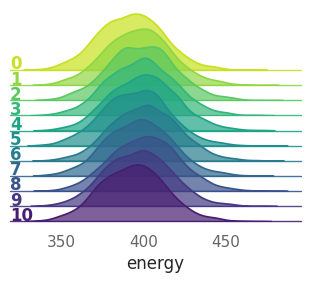

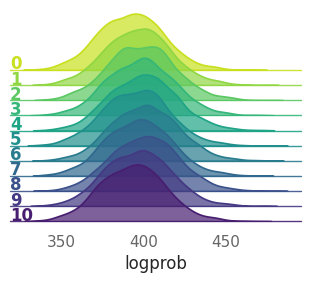

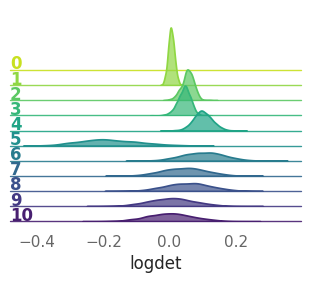

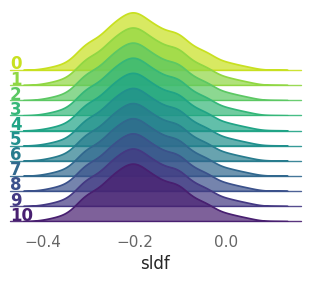

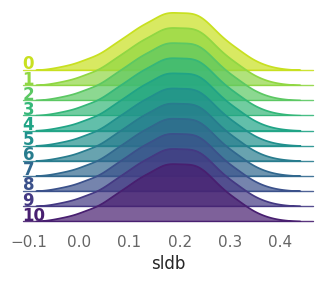

...

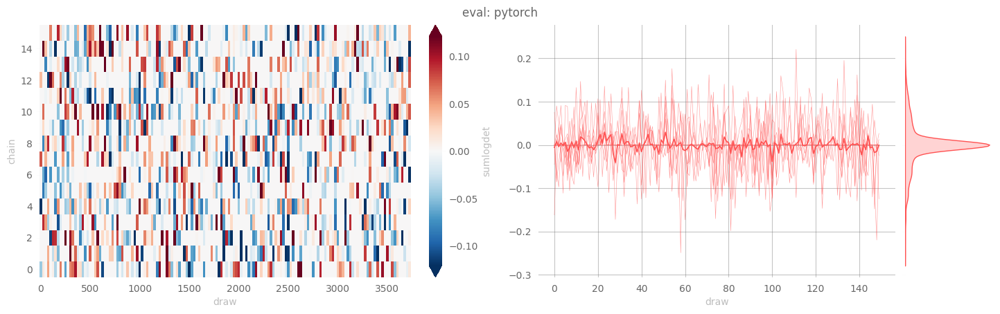

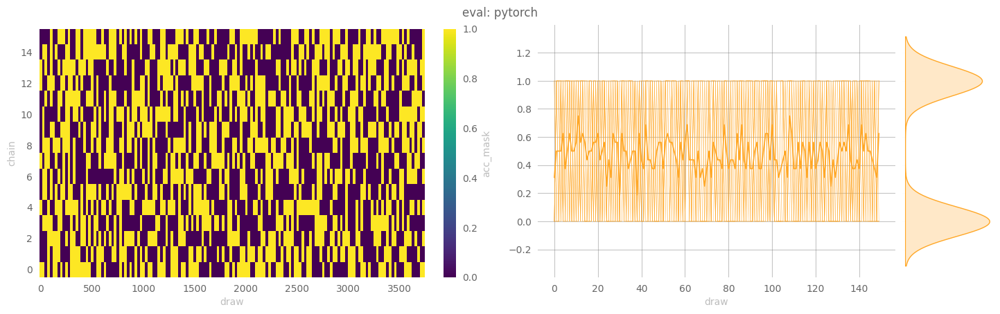

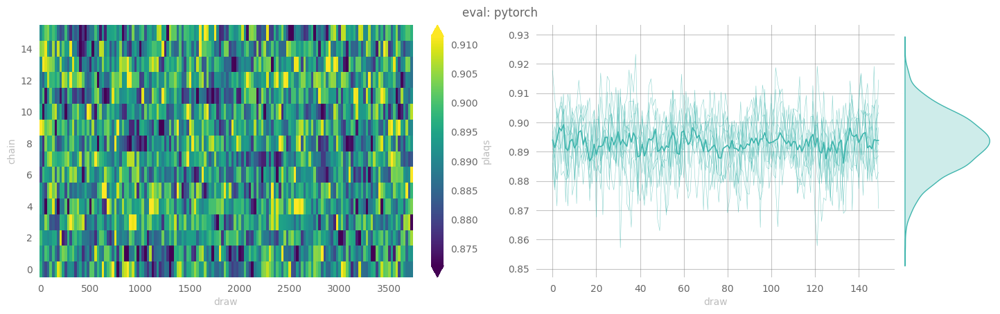

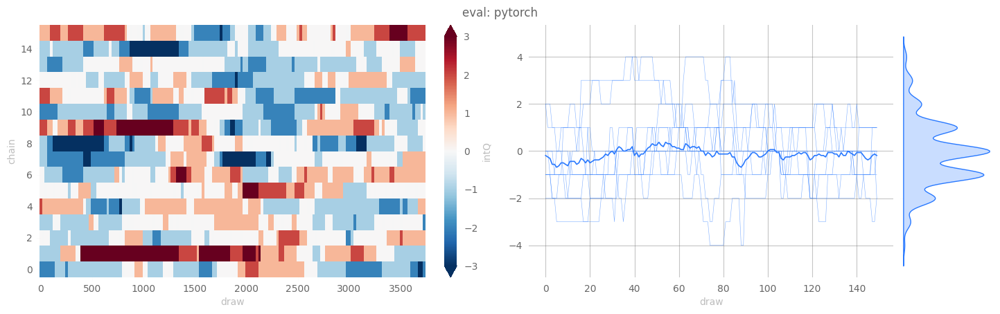

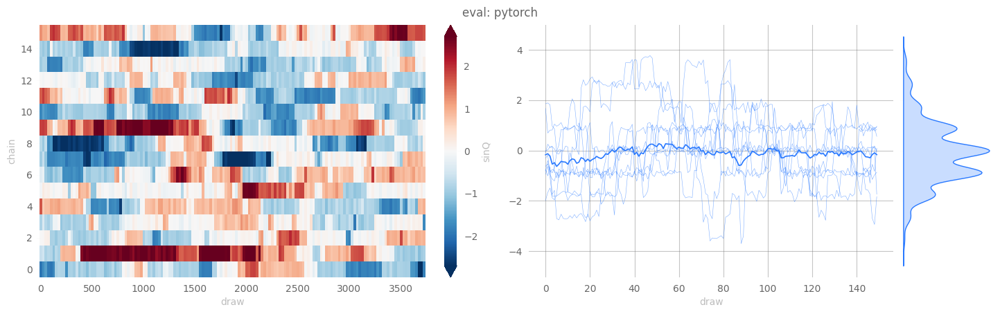

In [12]:
outputs['pytorch']['eval'] = ptExpU1.evaluate(job_type='eval', nchains=16, therm_frac=0.25)

[10/21/22 10:16:34] WARNING  Using step size eps: 0.2000 for generic HMC

                    WARNING  x.shape (original): torch.Size([2048, 2, 16, 16])

                    WARNING  x[:nchains].shape: torch.Size([16, 2, 16, 16])

                    INFO     eps=0.2                                                         
                             beta=5.0                                                        
                             nlog=10                                                         
                             table=<rich.table.Table object at 0x7f539b6d7a90>               
                             nprint=40                                                       
                             eval_steps=2000                                                 
                             nleapfrog=10

  2%|▏         | 38/2000 [00:00<00:32, 60.12it/s]

[10/21/22 10:16:35] INFO     hstep=40  dt=0.0146 beta=5.0000 loss=25.1842 dQsin=0.0265       
                             dQint=0.0000 energy=412.6810 logprob=412.6810 logdet=0.0000     
                             acc=0.2388 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8814        
                             intQ=0.0625 sinQ=0.0797

  4%|▍         | 75/2000 [00:01<00:37, 51.83it/s]

[10/21/22 10:16:36] INFO     hstep=80  dt=0.0184 beta=5.0000 loss=32.4265 dQsin=0.0655       
                             dQint=0.0000 energy=394.0948 logprob=394.0948 logdet=0.0000     
                             acc=0.4542 sumlogdet=0.0000 acc_mask=0.4375 plaqs=0.8897        
                             intQ=-0.0625 sinQ=-0.0189

  6%|▌         | 117/2000 [00:02<00:36, 50.98it/s]

                    INFO     hstep=120 dt=0.0185 beta=5.0000 loss=39.1099 dQsin=0.0089       
                             dQint=0.0000 energy=395.0005 logprob=395.0005 logdet=0.0000     
                             acc=0.2087 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8929        
                             intQ=-0.2500 sinQ=-0.2198

  8%|▊         | 160/2000 [00:03<00:34, 53.67it/s]

[10/21/22 10:16:37] INFO     hstep=160 dt=0.0159 beta=5.0000 loss=35.5953 dQsin=0.0555       
                             dQint=0.0625 energy=402.1041 logprob=402.1041 logdet=0.0000     
                             acc=0.2164 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8921        
                             intQ=0.0000 sinQ=0.0324

 10%|▉         | 197/2000 [00:03<00:33, 53.93it/s]

[10/21/22 10:16:38] INFO     hstep=200 dt=0.0249 beta=5.0000 loss=38.0289 dQsin=0.0676       
                             dQint=0.0625 energy=388.5206 logprob=388.5206 logdet=0.0000     
                             acc=0.2184 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8935        
                             intQ=-0.0000 sinQ=-0.0379

 12%|█▏        | 236/2000 [00:04<00:30, 57.37it/s]

[10/21/22 10:16:39] INFO     hstep=240 dt=0.0166 beta=5.0000 loss=40.4148 dQsin=0.0963       
                             dQint=0.0625 energy=402.7791 logprob=402.7791 logdet=0.0000     
                             acc=0.1560 sumlogdet=0.0000 acc_mask=0.2500 plaqs=0.8916        
                             intQ=0.0000 sinQ=-0.0329

 14%|█▎        | 274/2000 [00:05<00:30, 56.02it/s]

                    INFO     hstep=280 dt=0.0160 beta=5.0000 loss=21.4931 dQsin=0.0213       
                             dQint=0.0000 energy=390.9426 logprob=390.9426 logdet=0.0000     
                             acc=0.1741 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8934        
                             intQ=-0.1250 sinQ=-0.1196

 16%|█▌        | 317/2000 [00:05<00:32, 52.03it/s]

[10/21/22 10:16:40] INFO     hstep=320 dt=0.0181 beta=5.0000 loss=39.0198 dQsin=0.0398       
                             dQint=0.0000 energy=402.9886 logprob=402.9886 logdet=0.0000     
                             acc=0.0543 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8935        
                             intQ=-0.1250 sinQ=-0.1350

 18%|█▊        | 359/2000 [00:06<00:31, 51.91it/s]

[10/21/22 10:16:41] INFO     hstep=360 dt=0.0177 beta=5.0000 loss=29.4047 dQsin=0.0505       
                             dQint=0.0000 energy=394.9515 logprob=394.9515 logdet=0.0000     
                             acc=0.2944 sumlogdet=0.0000 acc_mask=0.3750 plaqs=0.8927        
                             intQ=-0.2500 sinQ=-0.2341

 20%|█▉        | 395/2000 [00:07<00:31, 50.34it/s]

[10/21/22 10:16:42] INFO     hstep=400 dt=0.0178 beta=5.0000 loss=20.5747 dQsin=0.0102       
                             dQint=0.0000 energy=400.8949 logprob=400.8949 logdet=0.0000     
                             acc=0.2180 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8926        
                             intQ=-0.2500 sinQ=-0.2241

 22%|██▏       | 437/2000 [00:08<00:29, 52.26it/s]

                    INFO     hstep=440 dt=0.0176 beta=5.0000 loss=28.5132 dQsin=0.0161       
                             dQint=0.0000 energy=394.9130 logprob=394.9130 logdet=0.0000     
                             acc=0.0895 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8958        
                             intQ=-0.4375 sinQ=-0.4079

 24%|██▍       | 479/2000 [00:09<00:28, 52.72it/s]

[10/21/22 10:16:43] INFO     hstep=480 dt=0.0177 beta=5.0000 loss=26.8795 dQsin=0.1076       
                             dQint=0.0625 energy=387.6927 logprob=387.6927 logdet=0.0000     
                             acc=0.1282 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8956        
                             intQ=-0.3125 sinQ=-0.2717

 26%|██▌       | 515/2000 [00:09<00:28, 51.39it/s]

[10/21/22 10:16:44] INFO     hstep=520 dt=0.0177 beta=5.0000 loss=39.5287 dQsin=0.0619       
                             dQint=0.0000 energy=392.2743 logprob=392.2743 logdet=0.0000     
                             acc=0.1364 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8938        
                             intQ=-0.3750 sinQ=-0.3177

 28%|██▊       | 557/2000 [00:10<00:28, 51.23it/s]

[10/21/22 10:16:45] INFO     hstep=560 dt=0.0178 beta=5.0000 loss=31.7172 dQsin=0.0436       
                             dQint=0.0000 energy=390.5687 logprob=390.5687 logdet=0.0000     
                             acc=0.2431 sumlogdet=0.0000 acc_mask=0.5000 plaqs=0.8942        
                             intQ=-0.3750 sinQ=-0.3617

 30%|██▉       | 599/2000 [00:11<00:26, 52.26it/s]

[10/21/22 10:16:46] INFO     hstep=600 dt=0.0178 beta=5.0000 loss=29.1764 dQsin=0.0213       
                             dQint=0.0000 energy=390.8584 logprob=390.8584 logdet=0.0000     
                             acc=0.1966 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8939        
                             intQ=-0.3125 sinQ=-0.3214

 32%|███▏      | 635/2000 [00:12<00:26, 51.21it/s]

                    INFO     hstep=640 dt=0.0177 beta=5.0000 loss=21.5729 dQsin=0.0718       
                             dQint=0.0000 energy=402.7285 logprob=402.7285 logdet=0.0000     
                             acc=0.2952 sumlogdet=0.0000 acc_mask=0.2500 plaqs=0.8913        
                             intQ=-0.1875 sinQ=-0.1651

 34%|███▍      | 677/2000 [00:13<00:25, 51.83it/s]

[10/21/22 10:16:47] INFO     hstep=680 dt=0.0177 beta=5.0000 loss=33.9595 dQsin=0.0315       
                             dQint=0.0000 energy=401.0615 logprob=401.0615 logdet=0.0000     
                             acc=0.2216 sumlogdet=0.0000 acc_mask=0.2500 plaqs=0.8906        
                             intQ=-0.2500 sinQ=-0.2528

 36%|███▌      | 719/2000 [00:13<00:24, 52.29it/s]

[10/21/22 10:16:48] INFO     hstep=720 dt=0.0179 beta=5.0000 loss=45.8151 dQsin=0.0235       
                             dQint=0.0000 energy=388.9688 logprob=388.9688 logdet=0.0000     
                             acc=0.2274 sumlogdet=0.0000 acc_mask=0.2500 plaqs=0.8948        
                             intQ=-0.3750 sinQ=-0.3036

 38%|███▊      | 755/2000 [00:14<00:24, 50.63it/s]

[10/21/22 10:16:49] INFO     hstep=760 dt=0.0178 beta=5.0000 loss=35.7845 dQsin=0.0623       
                             dQint=0.0000 energy=389.6058 logprob=389.6058 logdet=0.0000     
                             acc=0.2106 sumlogdet=0.0000 acc_mask=0.3125 plaqs=0.8944        
                             intQ=-0.5625 sinQ=-0.4427

 40%|███▉      | 797/2000 [00:15<00:23, 50.52it/s]

[10/21/22 10:16:50] INFO     hstep=800 dt=0.0177 beta=5.0000 loss=53.2461 dQsin=0.0213       
                             dQint=0.0000 energy=395.9181 logprob=395.9181 logdet=0.0000     
                             acc=0.1427 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8951        
                             intQ=-0.6875 sinQ=-0.5950

 42%|████▏     | 838/2000 [00:16<00:32, 35.66it/s]

                    INFO     hstep=840 dt=0.0185 beta=5.0000 loss=37.0951 dQsin=0.0086       
                             dQint=0.0000 energy=392.2552 logprob=392.2552 logdet=0.0000     
                             acc=0.2432 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8953        
                             intQ=-0.6250 sinQ=-0.5304

 44%|████▍     | 877/2000 [00:17<00:22, 49.50it/s]

[10/21/22 10:16:51] INFO     hstep=880 dt=0.0179 beta=5.0000 loss=57.1506 dQsin=0.0154       
                             dQint=0.0000 energy=398.5562 logprob=398.5562 logdet=0.0000     
                             acc=0.1052 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8949        
                             intQ=-0.7500 sinQ=-0.6219

 46%|████▌     | 919/2000 [00:18<00:20, 52.09it/s]

[10/21/22 10:16:52] INFO     hstep=920 dt=0.0178 beta=5.0000 loss=32.9671 dQsin=0.0560       
                             dQint=0.0000 energy=402.3872 logprob=402.3872 logdet=0.0000     
                             acc=0.2990 sumlogdet=0.0000 acc_mask=0.3125 plaqs=0.8908        
                             intQ=-0.8750 sinQ=-0.7211

 48%|████▊     | 955/2000 [00:18<00:20, 51.15it/s]

[10/21/22 10:16:53] INFO     hstep=960 dt=0.0180 beta=5.0000 loss=33.5910 dQsin=0.0879       
                             dQint=0.0625 energy=397.4750 logprob=397.4750 logdet=0.0000     
                             acc=0.1095 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8919        
                             intQ=-0.8125 sinQ=-0.7588

 50%|████▉     | 997/2000 [00:19<00:19, 51.95it/s]

[10/21/22 10:16:54] INFO     hstep=1000 dt=0.0178 beta=5.0000 loss=9.9878 dQsin=0.1148       
                             dQint=0.0625 energy=391.5787 logprob=391.5787 logdet=0.0000     
                             acc=0.3099 sumlogdet=0.0000 acc_mask=0.3125 plaqs=0.8951        
                             intQ=-0.7500 sinQ=-0.6667

 52%|█████▏    | 1039/2000 [00:20<00:18, 51.76it/s]

                    INFO     hstep=1040 dt=0.0180 beta=5.0000 loss=41.3456 dQsin=0.0000      
                             dQint=0.0000 energy=400.8589 logprob=400.8589 logdet=0.0000     
                             acc=0.0584 sumlogdet=0.0000 acc_mask=0.0000 plaqs=0.8945        
                             intQ=-0.6875 sinQ=-0.5568

 54%|█████▍    | 1075/2000 [00:21<00:18, 50.87it/s]

[10/21/22 10:16:55] INFO     hstep=1080 dt=0.0179 beta=5.0000 loss=27.7918 dQsin=0.0085      
                             dQint=0.0000 energy=401.2063 logprob=401.2063 logdet=0.0000     
                             acc=0.1234 sumlogdet=0.0000 acc_mask=0.0625 plaqs=0.8918        
                             intQ=-0.6875 sinQ=-0.6131

 56%|█████▌    | 1117/2000 [00:21<00:17, 51.89it/s]

[10/21/22 10:16:56] INFO     hstep=1120 dt=0.0178 beta=5.0000 loss=16.9344 dQsin=0.0400      
                             dQint=0.0000 energy=407.0458 logprob=407.0458 logdet=0.0000     
                             acc=0.3156 sumlogdet=0.0000 acc_mask=0.3125 plaqs=0.8895        
                             intQ=-0.5000 sinQ=-0.4011

 58%|█████▊    | 1159/2000 [00:22<00:16, 52.24it/s]

[10/21/22 10:16:57] INFO     hstep=1160 dt=0.0178 beta=5.0000 loss=10.0230 dQsin=0.0160      
                             dQint=0.0000 energy=394.7402 logprob=394.7402 logdet=0.0000     
                             acc=0.1755 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8922        
                             intQ=-0.6250 sinQ=-0.5239

 60%|█████▉    | 1195/2000 [00:23<00:15, 51.10it/s]

[10/21/22 10:16:58] INFO     hstep=1200 dt=0.0178 beta=5.0000 loss=43.8524 dQsin=0.0012      
                             dQint=0.0000 energy=395.7407 logprob=395.7407 logdet=0.0000     
                             acc=0.0678 sumlogdet=0.0000 acc_mask=0.0625 plaqs=0.8917        
                             intQ=-0.5000 sinQ=-0.4076

 62%|██████▏   | 1237/2000 [00:24<00:14, 51.86it/s]

                    INFO     hstep=1240 dt=0.0178 beta=5.0000 loss=42.2843 dQsin=0.0151      
                             dQint=0.0000 energy=395.3203 logprob=395.3203 logdet=0.0000     
                             acc=0.1962 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8940        
                             intQ=-0.4375 sinQ=-0.4049

 64%|██████▍   | 1279/2000 [00:25<00:13, 51.52it/s]

[10/21/22 10:16:59] INFO     hstep=1280 dt=0.0179 beta=5.0000 loss=32.1596 dQsin=0.0223      
                             dQint=0.0000 energy=394.9276 logprob=394.9276 logdet=0.0000     
                             acc=0.2070 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8936        
                             intQ=-0.4375 sinQ=-0.3439

 66%|██████▌   | 1315/2000 [00:25<00:13, 50.33it/s]

[10/21/22 10:17:00] INFO     hstep=1320 dt=0.0220 beta=5.0000 loss=29.1230 dQsin=0.0459      
                             dQint=0.0000 energy=399.4768 logprob=399.4768 logdet=0.0000     
                             acc=0.1526 sumlogdet=0.0000 acc_mask=0.2500 plaqs=0.8932        
                             intQ=-0.3125 sinQ=-0.3153

 68%|██████▊   | 1357/2000 [00:26<00:12, 51.49it/s]

[10/21/22 10:17:01] INFO     hstep=1360 dt=0.0180 beta=5.0000 loss=43.2047 dQsin=0.0181      
                             dQint=0.0000 energy=398.4680 logprob=398.4680 logdet=0.0000     
                             acc=0.1130 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8933        
                             intQ=-0.1250 sinQ=-0.1501

 70%|██████▉   | 1399/2000 [00:27<00:11, 51.74it/s]

[10/21/22 10:17:02] INFO     hstep=1400 dt=0.0179 beta=5.0000 loss=33.7880 dQsin=0.0402      
                             dQint=0.0000 energy=402.7618 logprob=402.7618 logdet=0.0000     
                             acc=0.1328 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8930        
                             intQ=-0.0625 sinQ=-0.1087

 72%|███████▏  | 1435/2000 [00:28<00:11, 50.63it/s]

                    INFO     hstep=1440 dt=0.0178 beta=5.0000 loss=34.4279 dQsin=0.0192      
                             dQint=0.0000 energy=404.6967 logprob=404.6967 logdet=0.0000     
                             acc=0.1892 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8921        
                             intQ=0.1250 sinQ=0.1333

 74%|███████▍  | 1477/2000 [00:28<00:10, 50.77it/s]

[10/21/22 10:17:03] INFO     hstep=1480 dt=0.0173 beta=5.0000 loss=35.7944 dQsin=0.0372      
                             dQint=0.0000 energy=401.9930 logprob=401.9930 logdet=0.0000     
                             acc=0.2666 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8934        
                             intQ=-0.0625 sinQ=-0.0331

 76%|███████▌  | 1519/2000 [00:29<00:08, 53.62it/s]

[10/21/22 10:17:04] INFO     hstep=1520 dt=0.0172 beta=5.0000 loss=38.7257 dQsin=0.0002      
                             dQint=0.0000 energy=396.2147 logprob=396.2147 logdet=0.0000     
                             acc=0.1224 sumlogdet=0.0000 acc_mask=0.0625 plaqs=0.8963        
                             intQ=0.0000 sinQ=-0.0163

 78%|███████▊  | 1555/2000 [00:30<00:08, 52.58it/s]

[10/21/22 10:17:05] INFO     hstep=1560 dt=0.0171 beta=5.0000 loss=26.8220 dQsin=0.0581      
                             dQint=0.0000 energy=394.2128 logprob=394.2128 logdet=0.0000     
                             acc=0.2292 sumlogdet=0.0000 acc_mask=0.3125 plaqs=0.8914        
                             intQ=-0.1875 sinQ=-0.1453

 80%|███████▉  | 1597/2000 [00:31<00:07, 53.64it/s]

                    INFO     hstep=1600 dt=0.0171 beta=5.0000 loss=35.2611 dQsin=0.0000      
                             dQint=0.0000 energy=403.9623 logprob=403.9623 logdet=0.0000     
                             acc=0.0575 sumlogdet=0.0000 acc_mask=0.0000 plaqs=0.8878        
                             intQ=-0.4375 sinQ=-0.4054

 82%|████████▏ | 1639/2000 [00:32<00:06, 54.12it/s]

[10/21/22 10:17:06] INFO     hstep=1640 dt=0.0171 beta=5.0000 loss=36.5689 dQsin=0.0759      
                             dQint=0.0000 energy=403.8337 logprob=403.8337 logdet=0.0000     
                             acc=0.4095 sumlogdet=0.0000 acc_mask=0.3125 plaqs=0.8902        
                             intQ=-0.4375 sinQ=-0.4157

 84%|████████▍ | 1675/2000 [00:32<00:06, 52.95it/s]

[10/21/22 10:17:07] INFO     hstep=1680 dt=0.0171 beta=5.0000 loss=34.5115 dQsin=0.0150      
                             dQint=0.0000 energy=390.6526 logprob=390.6526 logdet=0.0000     
                             acc=0.1266 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8928        
                             intQ=-0.3125 sinQ=-0.2979

 86%|████████▌ | 1717/2000 [00:33<00:05, 53.60it/s]

[10/21/22 10:17:08] INFO     hstep=1720 dt=0.0171 beta=5.0000 loss=21.0353 dQsin=0.0215      
                             dQint=0.0000 energy=391.9943 logprob=391.9943 logdet=0.0000     
                             acc=0.1878 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8921        
                             intQ=-0.4375 sinQ=-0.3639

 88%|████████▊ | 1759/2000 [00:34<00:04, 53.07it/s]

                    INFO     hstep=1760 dt=0.0173 beta=5.0000 loss=32.0888 dQsin=0.0336      
                             dQint=0.0000 energy=397.4776 logprob=397.4776 logdet=0.0000     
                             acc=0.1827 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8940        
                             intQ=-0.5000 sinQ=-0.4847

 90%|████████▉ | 1795/2000 [00:35<00:03, 52.43it/s]

[10/21/22 10:17:09] INFO     hstep=1800 dt=0.0171 beta=5.0000 loss=31.9655 dQsin=0.0148      
                             dQint=0.0000 energy=394.3252 logprob=394.3252 logdet=0.0000     
                             acc=0.1683 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8936        
                             intQ=-0.4375 sinQ=-0.3169

 92%|█████████▏| 1837/2000 [00:35<00:03, 52.74it/s]

[10/21/22 10:17:10] INFO     hstep=1840 dt=0.0171 beta=5.0000 loss=35.8153 dQsin=0.0196      
                             dQint=0.0000 energy=392.7437 logprob=392.7437 logdet=0.0000     
                             acc=0.1849 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8949        
                             intQ=-0.5000 sinQ=-0.3982

 94%|█████████▍| 1879/2000 [00:36<00:02, 54.44it/s]

[10/21/22 10:17:11] INFO     hstep=1880 dt=0.0171 beta=5.0000 loss=44.2899 dQsin=0.0074      
                             dQint=0.0000 energy=401.4882 logprob=401.4882 logdet=0.0000     
                             acc=0.1412 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8933        
                             intQ=-0.3750 sinQ=-0.3557

 96%|█████████▌| 1920/2000 [00:37<00:01, 52.24it/s]

[10/21/22 10:17:12] INFO     hstep=1920 dt=0.0173 beta=5.0000 loss=33.7010 dQsin=0.0704      
                             dQint=0.0000 energy=396.2674 logprob=396.2674 logdet=0.0000     
                             acc=0.2490 sumlogdet=0.0000 acc_mask=0.3125 plaqs=0.8914        
                             intQ=-0.6250 sinQ=-0.5795

 98%|█████████▊| 1956/2000 [00:38<00:00, 52.20it/s]

                    INFO     hstep=1960 dt=0.0174 beta=5.0000 loss=40.6268 dQsin=0.0310      
                             dQint=0.0000 energy=392.7041 logprob=392.7041 logdet=0.0000     
                             acc=0.0724 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8990        
                             intQ=-0.6250 sinQ=-0.5568

100%|██████████| 2000/2000 [00:38<00:00, 51.28it/s]


[10/21/22 10:17:14] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-093852/pytorch/hmc/plots/ridgeplots/energy_ridgeplot.svg

[10/21/22 10:17:16] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-093852/pytorch/hmc/plots/ridgeplots/logprob_ridgeplot.svg

[10/21/22 10:17:17] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-093852/pytorch/hmc/plots/ridgeplots/logdet_ridgeplot.svg

[10/21/22 10:17:27] INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/
                             thetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-
                             21-093852/pytorch/hmc/data/hmc_data.h5

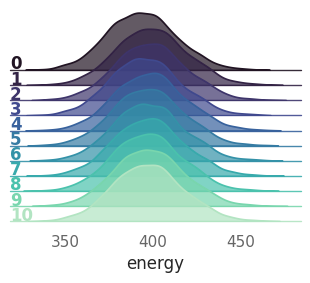

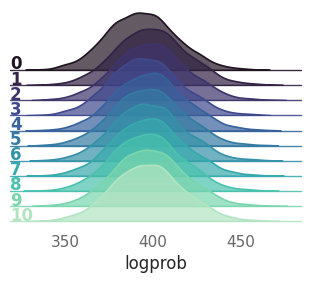

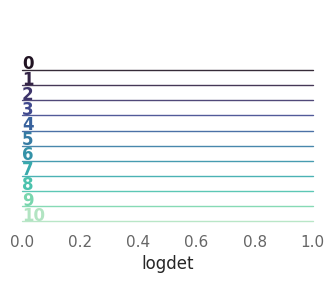

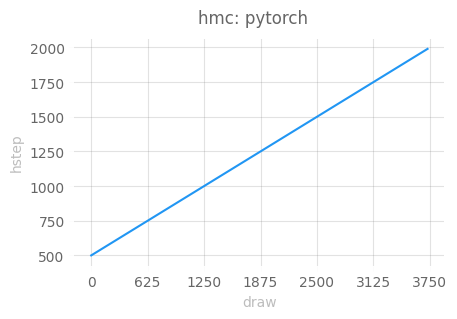

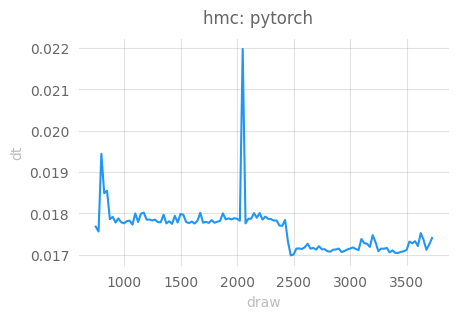

...

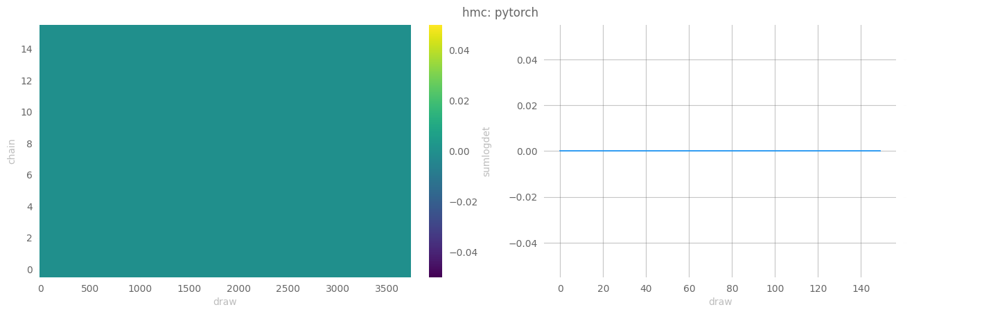

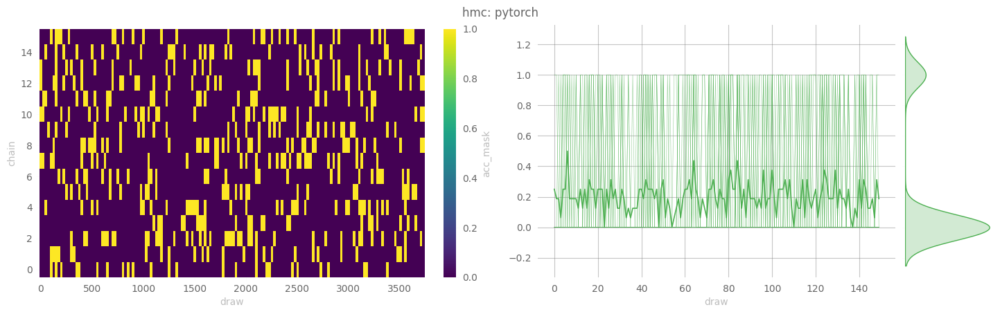

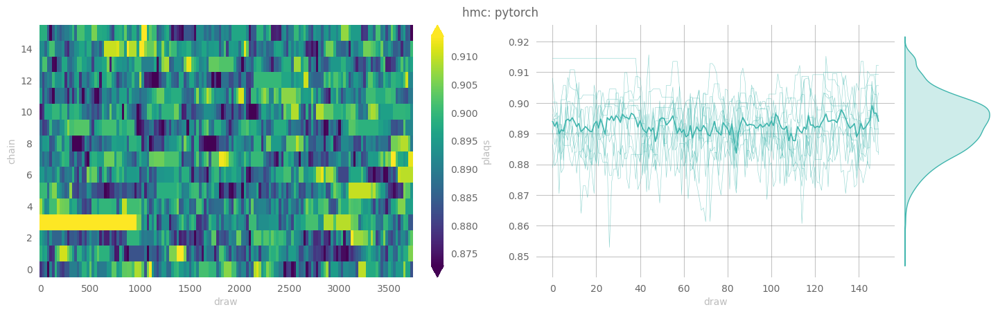

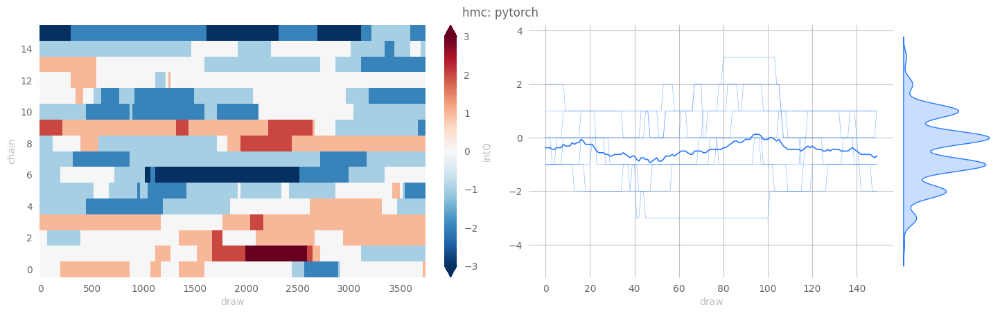

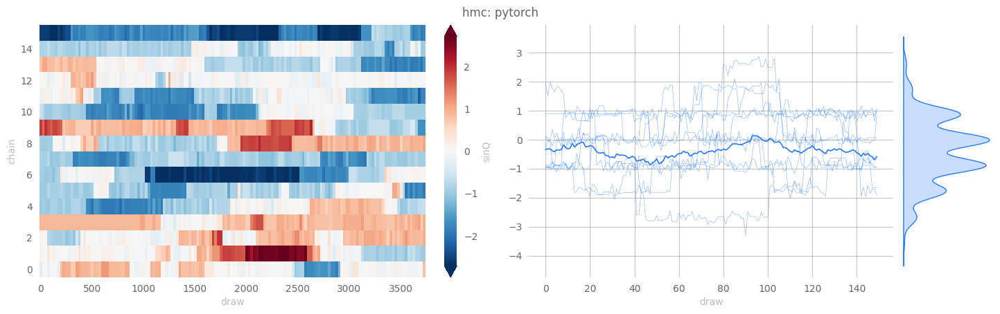

In [13]:
outputs['pytorch']['hmc'] = ptExpU1.evaluate(job_type='hmc', nchains=16, therm_frac=0.25)

In [25]:
dsetpt_eval = ptExpU1.trainer.histories['eval'].get_dataset()
dsetpt_hmc = ptExpU1.trainer.histories['hmc'].get_dataset()

In [26]:
dQint_eval = dsetpt_eval['dQint']
dQint_hmc = dsetpt_hmc['dQint']
dQint_eval.shape

(16, 600)

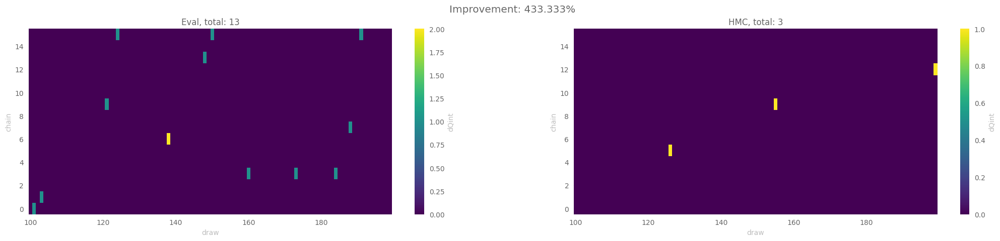

In [28]:
import matplotlib.pyplot as plt

etot = dsets['pt']['eval']['dQint'][:, -100:].astype(int).sum()
htot = dsets['pt']['hmc']['dQint'][:, -100:].astype(int).sum()

fsize = plt.rcParams['figure.figsize']
figsize = (4. * fsize[0], fsize[1])
fig, ax = plt.subplots(figsize=figsize, ncols=2)
_ = dsets['pt']['eval']['dQint'][:, -100:].astype(int).plot(ax=ax[0])
_ = dsets['pt']['hmc']['dQint'][:, -100:].astype(int).plot(ax=ax[1])
_ = ax[0].set_title(f'Eval, total: {etot}', fontsize='large');
_ = ax[1].set_title(f'HMC, total: {htot}', fontsize='large');
_ = fig.suptitle(fr'Improvement: {100*(etot / htot):3.3f}%', fontsize='x-large')

##  TensorFlow:

In [29]:
tfExpU1 = get_experiment(
    overrides=[
        *defaults_u1,
        'framework=tensorflow',
        'init_wandb=false',
        'init_aim=false',
    ]
)

─────────────────────────────────────────────── ERA: 0 / 10, BETA: 1.000 ───────────────────────────────────────────────

[10/21/22 10:29:10] INFO     era=0   epoch=0   train_step=0.0000 dt=33.3677 beta=1.0000      
                             loss=-271.6030 dQsin=0.9316 dQint=2.2319 energy=512.2968        
                             logprob=512.5821 logdet=-0.2853 sldf=-0.4554 sldb=0.1701        
                             sld=-0.2853 xeps=0.1010 veps=0.0990 acc=0.4873 sumlogdet=-0.0082
                             acc_mask=0.4868 plaqs=0.0006 intQ=-0.0947 sinQ=0.0021           
                             tstep=0.0000 lr=0.0010

[10/21/22 10:29:31] INFO     era=0   epoch=100 train_step=100.0000 dt=0.0739 beta=1.0000     
                             loss=-371.0381 dQsin=1.5123 dQint=2.8984 energy=398.5475        
                             logprob=398.4662 logdet=0.0813 sldf=0.1200 sldb=-0.0387         
                             sld=0.0813 xeps=0.1089 veps=0.1079 acc=0.9187 sumlogdet=0.0018  
                             acc_mask=0.9292 plaqs=0.4446 intQ=0.0200 sinQ=0.0093            
                             tstep=100.0000 lr=0.0010

[10/21/22 10:29:52] INFO     era=0   epoch=200 train_step=200.0000 dt=0.0756 beta=1.0000     
                             loss=-463.2661 dQsin=1.6767 dQint=3.1226 energy=397.1304        
                             logprob=397.1250 logdet=0.0053 sldf=0.0077 sldb=-0.0023         
                             sld=0.0053 xeps=0.1302 veps=0.1303 acc=0.9570 sumlogdet=0.0009  
                             acc_mask=0.9517 plaqs=0.4476 intQ=-0.0532 sinQ=0.0025           
                             tstep=200.0000 lr=0.0010

[10/21/22 10:30:13] INFO     era=0   epoch=300 train_step=300.0000 dt=0.0689 beta=1.0000     
                             loss=-526.0648 dQsin=1.7988 dQint=3.2534 energy=397.0204        
                             logprob=397.0188 logdet=0.0016 sldf=0.0025 sldb=-0.0009         
                             sld=0.0016 xeps=0.1508 veps=0.1507 acc=0.9431 sumlogdet=-0.0001 
                             acc_mask=0.9478 plaqs=0.4482 intQ=-0.0151 sinQ=-0.0138          
                             tstep=300.0000 lr=0.0010

[10/21/22 10:30:35] INFO     era=0   epoch=400 train_step=400.0000 dt=0.0798 beta=1.0000     
                             loss=-560.9146 dQsin=1.8196 dQint=3.2666 energy=397.8357        
                             logprob=397.8345 logdet=0.0011 sldf=0.0017 sldb=-0.0006         
                             sld=0.0011 xeps=0.1679 veps=0.1681 acc=0.9346 sumlogdet=0.0001  
                             acc_mask=0.9316 plaqs=0.4464 intQ=0.0332 sinQ=0.0201            
                             tstep=400.0000 lr=0.0010

[10/21/22 10:30:53] INFO     Saving took: 0.013808s

                    INFO     Era 0 took: 139.697s

─────────────────────────────────────────────── ERA: 1 / 10, BETA: 1.000 ───────────────────────────────────────────────

[10/21/22 10:30:56] INFO     era=1   epoch=0   train_step=500.0000 dt=0.0760 beta=1.0000     
                             loss=-582.3911 dQsin=1.8667 dQint=3.4009 energy=397.4498        
                             logprob=397.4492 logdet=0.0006 sldf=0.0010 sldb=-0.0004         
                             sld=0.0006 xeps=0.1816 veps=0.1824 acc=0.9318 sumlogdet=-0.0000 
                             acc_mask=0.9370 plaqs=0.4477 intQ=0.0483 sinQ=0.0381            
                             tstep=500.0000 lr=0.0010

[10/21/22 10:31:18] INFO     era=1   epoch=100 train_step=600.0000 dt=0.0683 beta=1.0000     
                             loss=-607.4951 dQsin=1.8800 dQint=3.4160 energy=397.6267        
                             logprob=397.6263 logdet=0.0004 sldf=0.0006 sldb=-0.0002         
                             sld=0.0004 xeps=0.1926 veps=0.1925 acc=0.9372 sumlogdet=0.0000  
                             acc_mask=0.9360 plaqs=0.4462 intQ=-0.0161 sinQ=-0.0020          
                             tstep=600.0000 lr=0.0010

[10/21/22 10:31:39] INFO     era=1   epoch=200 train_step=700.0000 dt=0.0700 beta=1.0000     
                             loss=-630.6816 dQsin=1.9559 dQint=3.4336 energy=397.8169        
                             logprob=397.8166 logdet=0.0003 sldf=0.0004 sldb=-0.0002         
                             sld=0.0003 xeps=0.2015 veps=0.2012 acc=0.9340 sumlogdet=-0.0001 
                             acc_mask=0.9351 plaqs=0.4463 intQ=0.0356 sinQ=0.0365            
                             tstep=700.0000 lr=0.0010

[10/21/22 10:32:00] INFO     era=1   epoch=300 train_step=800.0000 dt=0.0724 beta=1.0000     
                             loss=-638.9410 dQsin=1.9612 dQint=3.4810 energy=398.1483        
                             logprob=398.1480 logdet=0.0002 sldf=0.0004 sldb=-0.0001         
                             sld=0.0002 xeps=0.2086 veps=0.2075 acc=0.9333 sumlogdet=-0.0000 
                             acc_mask=0.9277 plaqs=0.4468 intQ=0.0742 sinQ=0.0237            
                             tstep=800.0000 lr=0.0010

[10/21/22 10:32:20] INFO     era=1   epoch=400 train_step=900.0000 dt=0.0696 beta=1.0000     
                             loss=-657.4372 dQsin=2.0033 dQint=3.5610 energy=398.5365        
                             logprob=398.5363 logdet=0.0002 sldf=0.0003 sldb=-0.0001         
                             sld=0.0002 xeps=0.2135 veps=0.2124 acc=0.9379 sumlogdet=0.0001  
                             acc_mask=0.9385 plaqs=0.4462 intQ=0.0571 sinQ=0.0227            
                             tstep=900.0000 lr=0.0010

[10/21/22 10:32:38] INFO     Saving took: 0.000972033s

                    INFO     Era 1 took: 105.035s

                    INFO     Avgs over last era:                                             
                              train_step=737.5000, dt=0.0710, beta=1.0000, loss=-640.6652,   
                             dQsin=1.9616, dQint=3.4986, energy=397.9708, logprob=397.9705,  
                             logdet=0.0003, sldf=0.0004, sldb=-0.0002, sld=0.0003,           
                             xeps=0.2024, veps=0.2019, acc=0.9356, sumlogdet=-0.0000,        
                             acc_mask=0.9359, plaqs=0.4466, intQ=0.0193, sinQ=0.0099,        
                             tstep=737.5000, lr=0.0010                                       
                    

─────────────────────────────────────────────── ERA: 2 / 10, BETA: 1.000 ───────────────────────────────────────────────

[10/21/22 10:32:41] INFO     era=2   epoch=0   train_step=1000.0000 dt=0.0778 beta=1.0000    
                             loss=-654.1663 dQsin=1.9857 dQint=3.4761 energy=397.6729        
                             logprob=397.6728 logdet=0.0001 sldf=0.0002 sldb=-0.0001         
                             sld=0.0001 xeps=0.2178 veps=0.2167 acc=0.9313 sumlogdet=-0.0000 
                             acc_mask=0.9341 plaqs=0.4455 intQ=0.0283 sinQ=0.0163            
                             tstep=1000.0000 lr=0.0010

[10/21/22 10:33:02] INFO     era=2   epoch=100 train_step=1100.0000 dt=0.0736 beta=1.0000    
                             loss=-682.9923 dQsin=2.0321 dQint=3.5396 energy=397.4806        
                             logprob=397.4805 logdet=0.0001 sldf=0.0001 sldb=-0.0000         
                             sld=0.0001 xeps=0.2207 veps=0.2192 acc=0.9391 sumlogdet=0.0000  
                             acc_mask=0.9409 plaqs=0.4470 intQ=0.0693 sinQ=0.0366            
                             tstep=1100.0000 lr=0.0010

[10/21/22 10:33:24] INFO     era=2   epoch=200 train_step=1200.0000 dt=0.0678 beta=1.0000    
                             loss=-654.4610 dQsin=1.9755 dQint=3.5425 energy=398.5586        
                             logprob=398.5585 logdet=0.0001 sldf=0.0001 sldb=-0.0000         
                             sld=0.0001 xeps=0.2233 veps=0.2216 acc=0.9367 sumlogdet=0.0000  
                             acc_mask=0.9375 plaqs=0.4448 intQ=-0.0596 sinQ=-0.0211          
                             tstep=1200.0000 lr=0.0010

[10/21/22 10:33:44] INFO     era=2   epoch=300 train_step=1300.0000 dt=0.0664 beta=1.0000    
                             loss=-677.5624 dQsin=1.9968 dQint=3.5723 energy=397.1008        
                             logprob=397.1007 logdet=0.0001 sldf=0.0001 sldb=-0.0000         
                             sld=0.0001 xeps=0.2255 veps=0.2235 acc=0.9383 sumlogdet=-0.0000 
                             acc_mask=0.9346 plaqs=0.4474 intQ=0.0962 sinQ=-0.0004           
                             tstep=1300.0000 lr=0.0010

[10/21/22 10:34:05] INFO     era=2   epoch=400 train_step=1400.0000 dt=0.0712 beta=1.0000    
                             loss=-725.5719 dQsin=2.0834 dQint=3.6621 energy=397.9839        
                             logprob=397.9838 logdet=0.0001 sldf=0.0001 sldb=-0.0000         
                             sld=0.0001 xeps=0.2271 veps=0.2251 acc=0.9382 sumlogdet=0.0000  
                             acc_mask=0.9312 plaqs=0.4453 intQ=0.0005 sinQ=0.0557            
                             tstep=1400.0000 lr=0.0010

[10/21/22 10:34:22] INFO     Saving took: 0.000786543s

                    INFO     Era 2 took: 104.404s

                    INFO     Avgs over last era:                                             
                              train_step=1237.5000, dt=0.0718, beta=1.0000, loss=-680.7086,  
                             dQsin=2.0067, dQint=3.6046, energy=397.9353, logprob=397.9352,  
                             logdet=0.0001, sldf=0.0001, sldb=-0.0000, sld=0.0001,           
                             xeps=0.2238, veps=0.2219, acc=0.9357, sumlogdet=-0.0000,        
                             acc_mask=0.9345, plaqs=0.4462, intQ=0.0049, sinQ=-0.0026,       
                             tstep=1237.5000, lr=0.0010                                      
                    

─────────────────────────────────────────────── ERA: 3 / 10, BETA: 1.000 ───────────────────────────────────────────────

[10/21/22 10:34:25] INFO     era=3   epoch=0   train_step=1500.0000 dt=0.0689 beta=1.0000    
                             loss=-703.3911 dQsin=2.0346 dQint=3.6182 energy=397.9846        
                             logprob=397.9846 logdet=0.0001 sldf=0.0001 sldb=-0.0000         
                             sld=0.0001 xeps=0.2291 veps=0.2268 acc=0.9382 sumlogdet=0.0000  
                             acc_mask=0.9424 plaqs=0.4460 intQ=-0.0513 sinQ=-0.0609          
                             tstep=1500.0000 lr=0.0010

[10/21/22 10:34:46] INFO     era=3   epoch=100 train_step=1600.0000 dt=0.0712 beta=1.0000    
                             loss=-679.8505 dQsin=1.9911 dQint=3.6045 energy=397.8466        
                             logprob=397.8466 logdet=0.0000 sldf=0.0001 sldb=-0.0000         
                             sld=0.0000 xeps=0.2299 veps=0.2282 acc=0.9377 sumlogdet=-0.0000 
                             acc_mask=0.9272 plaqs=0.4480 intQ=0.0205 sinQ=0.0389            
                             tstep=1600.0000 lr=0.0010

[10/21/22 10:35:08] INFO     era=3   epoch=200 train_step=1700.0000 dt=0.0774 beta=1.0000    
                             loss=-666.0608 dQsin=1.9821 dQint=3.5781 energy=397.9787        
                             logprob=397.9787 logdet=0.0000 sldf=0.0001 sldb=-0.0000         
                             sld=0.0000 xeps=0.2315 veps=0.2292 acc=0.9423 sumlogdet=-0.0000 
                             acc_mask=0.9390 plaqs=0.4465 intQ=0.0381 sinQ=-0.0191           
                             tstep=1700.0000 lr=0.0010

[10/21/22 10:35:30] INFO     era=3   epoch=300 train_step=1800.0000 dt=0.0634 beta=1.0000    
                             loss=-663.4323 dQsin=2.0126 dQint=3.6240 energy=398.2423        
                             logprob=398.2423 logdet=0.0001 sldf=0.0001 sldb=-0.0000         
                             sld=0.0001 xeps=0.2320 veps=0.2294 acc=0.9396 sumlogdet=0.0000  
                             acc_mask=0.9458 plaqs=0.4468 intQ=0.0107 sinQ=-0.0124           
                             tstep=1800.0000 lr=0.0010

[10/21/22 10:35:51] INFO     era=3   epoch=400 train_step=1900.0000 dt=0.0725 beta=1.0000    
                             loss=-711.0102 dQsin=2.0449 dQint=3.7295 energy=398.0131        
                             logprob=398.0130 logdet=0.0000 sldf=0.0000 sldb=-0.0000         
                             sld=0.0000 xeps=0.2326 veps=0.2300 acc=0.9402 sumlogdet=0.0001  
                             acc_mask=0.9404 plaqs=0.4470 intQ=-0.0659 sinQ=-0.0155          
                             tstep=1900.0000 lr=0.0010

[10/21/22 10:36:08] INFO     Saving took: 0.000803471s

                    INFO     Era 3 took: 106.381s

                    INFO     Avgs over last era:                                             
                              train_step=1737.5000, dt=0.0765, beta=1.0000, loss=-690.3471,  
                             dQsin=2.0320, dQint=3.6490, energy=397.7607, logprob=397.7607,  
                             logdet=0.0000, sldf=0.0001, sldb=-0.0000, sld=0.0000,           
                             xeps=0.2313, veps=0.2290, acc=0.9405, sumlogdet=-0.0000,        
                             acc_mask=0.9406, plaqs=0.4468, intQ=-0.0074, sinQ=-0.0009,      
                             tstep=1737.5000, lr=0.0010                                      
                    

─────────────────────────────────────────────── ERA: 4 / 10, BETA: 2.000 ───────────────────────────────────────────────

[10/21/22 10:36:12] INFO     era=4   epoch=0   train_step=2000.0000 dt=0.0726 beta=2.0000    
                             loss=-507.5904 dQsin=1.6000 dQint=2.8340 energy=540.4786        
                             logprob=540.4785 logdet=0.0002 sldf=0.0003 sldb=-0.0001         
                             sld=0.0002 xeps=0.2331 veps=0.2295 acc=0.8328 sumlogdet=-0.0001 
                             acc_mask=0.8228 plaqs=0.4448 intQ=0.0562 sinQ=0.0220            
                             tstep=2000.0000 lr=0.0010

[10/21/22 10:36:33] INFO     era=4   epoch=100 train_step=2100.0000 dt=0.0796 beta=2.0000    
                             loss=-304.9066 dQsin=1.2611 dQint=1.7847 energy=412.3102        
                             logprob=412.3101 logdet=0.0001 sldf=0.0002 sldb=-0.0000         
                             sld=0.0001 xeps=0.2345 veps=0.2321 acc=0.8505 sumlogdet=0.0001  
                             acc_mask=0.8496 plaqs=0.6976 intQ=-0.0122 sinQ=-0.0123          
                             tstep=2100.0000 lr=0.0010

[10/21/22 10:36:53] INFO     era=4   epoch=200 train_step=2200.0000 dt=0.0693 beta=2.0000    
                             loss=-319.5336 dQsin=1.3093 dQint=1.8501 energy=411.8928        
                             logprob=411.8927 logdet=0.0001 sldf=0.0001 sldb=-0.0000         
                             sld=0.0001 xeps=0.2358 veps=0.2340 acc=0.8555 sumlogdet=0.0000  
                             acc_mask=0.8525 plaqs=0.6970 intQ=-0.0356 sinQ=-0.0074          
                             tstep=2200.0000 lr=0.0010

[10/21/22 10:37:14] INFO     era=4   epoch=300 train_step=2300.0000 dt=0.0695 beta=2.0000    
                             loss=-325.1541 dQsin=1.3524 dQint=1.9248 energy=410.4694        
                             logprob=410.4693 logdet=0.0001 sldf=0.0001 sldb=-0.0000         
                             sld=0.0001 xeps=0.2370 veps=0.2356 acc=0.8528 sumlogdet=0.0000  
                             acc_mask=0.8496 plaqs=0.6986 intQ=0.0728 sinQ=0.0321            
                             tstep=2300.0000 lr=0.0010

[10/21/22 10:37:35] INFO     era=4   epoch=400 train_step=2400.0000 dt=0.0692 beta=2.0000    
                             loss=-304.2042 dQsin=1.2865 dQint=1.8311 energy=411.1464        
                             logprob=411.1464 logdet=0.0001 sldf=0.0001 sldb=-0.0000         
                             sld=0.0001 xeps=0.2376 veps=0.2366 acc=0.8460 sumlogdet=-0.0000 
                             acc_mask=0.8511 plaqs=0.6980 intQ=0.0527 sinQ=0.0497            
                             tstep=2400.0000 lr=0.0010

[10/21/22 10:37:52] INFO     Saving took: 0.339086s

                    INFO     Era 4 took: 103.407s

                    INFO     Avgs over last era:                                             
                              train_step=2237.5000, dt=0.0707, beta=2.0000, loss=-318.1533,  
                             dQsin=1.3045, dQint=1.8858, energy=418.0500, logprob=418.0500,  
                             logdet=0.0001, sldf=0.0001, sldb=-0.0000, sld=0.0001,           
                             xeps=0.2362, veps=0.2341, acc=0.8473, sumlogdet=-0.0000,        
                             acc_mask=0.8474, plaqs=0.6850, intQ=-0.0005, sinQ=0.0002,       
                             tstep=2237.5000, lr=0.0010                                      
                    

─────────────────────────────────────────────── ERA: 5 / 10, BETA: 3.000 ───────────────────────────────────────────────

[10/21/22 10:37:55] INFO     era=5   epoch=0   train_step=2500.0000 dt=0.0711 beta=3.0000    
                             loss=-203.3897 dQsin=1.0046 dQint=1.3774 energy=489.9355        
                             logprob=489.9352 logdet=0.0002 sldf=0.0004 sldb=-0.0002         
                             sld=0.0002 xeps=0.2387 veps=0.2380 acc=0.7783 sumlogdet=-0.0001 
                             acc_mask=0.7759 plaqs=0.6976 intQ=-0.0444 sinQ=-0.0496          
                             tstep=2500.0000 lr=0.0010

[10/21/22 10:38:16] INFO     era=5   epoch=100 train_step=2600.0000 dt=0.0702 beta=3.0000    
                             loss=-79.0868 dQsin=0.5751 dQint=0.6455 energy=404.5031         
                             logprob=404.5030 logdet=0.0001 sldf=0.0002 sldb=-0.0001         
                             sld=0.0001 xeps=0.2402 veps=0.2332 acc=0.6943 sumlogdet=-0.0001 
                             acc_mask=0.6953 plaqs=0.8103 intQ=0.0430 sinQ=0.0308            
                             tstep=2600.0000 lr=0.0010

[10/21/22 10:38:36] INFO     era=5   epoch=200 train_step=2700.0000 dt=0.0682 beta=3.0000    
                             loss=-71.4305 dQsin=0.5602 dQint=0.6401 energy=404.1162         
                             logprob=404.1160 logdet=0.0001 sldf=0.0002 sldb=-0.0001         
                             sld=0.0001 xeps=0.2389 veps=0.2309 acc=0.6896 sumlogdet=0.0000  
                             acc_mask=0.6992 plaqs=0.8102 intQ=-0.0015 sinQ=-0.0052          
                             tstep=2700.0000 lr=0.0010

[10/21/22 10:38:57] INFO     era=5   epoch=300 train_step=2800.0000 dt=0.0735 beta=3.0000    
                             loss=-74.7237 dQsin=0.5675 dQint=0.6445 energy=403.7978         
                             logprob=403.7976 logdet=0.0001 sldf=0.0003 sldb=-0.0001         
                             sld=0.0001 xeps=0.2369 veps=0.2306 acc=0.7227 sumlogdet=-0.0000 
                             acc_mask=0.7212 plaqs=0.8099 intQ=0.0049 sinQ=0.0079            
                             tstep=2800.0000 lr=0.0010

[10/21/22 10:39:18] INFO     era=5   epoch=400 train_step=2900.0000 dt=0.0715 beta=3.0000    
                             loss=-73.5628 dQsin=0.5672 dQint=0.6367 energy=404.0590         
                             logprob=404.0591 logdet=-0.0001 sldf=-0.0000 sldb=-0.0001       
                             sld=-0.0001 xeps=0.2368 veps=0.2288 acc=0.6971 sumlogdet=-0.0002
                             acc_mask=0.6973 plaqs=0.8103 intQ=-0.0156 sinQ=-0.0208          
                             tstep=2900.0000 lr=0.0010

[10/21/22 10:39:35] INFO     Saving took: 0.000750542s

                    INFO     Era 5 took: 103.447s

                    INFO     Avgs over last era:                                             
                              train_step=2737.5000, dt=0.0716, beta=3.0000, loss=-82.9268,   
                             dQsin=0.5942, dQint=0.6802, energy=408.5681, logprob=408.5679,  
                             logdet=0.0002, sldf=0.0003, sldb=-0.0001, sld=0.0002,           
                             xeps=0.2383, veps=0.2313, acc=0.6978, sumlogdet=0.0000,         
                             acc_mask=0.6975, plaqs=0.8044, intQ=-0.0025, sinQ=0.0001,       
                             tstep=2737.5000, lr=0.0010                                      
                    

─────────────────────────────────────────────── ERA: 6 / 10, BETA: 4.000 ───────────────────────────────────────────────

[10/21/22 10:39:39] INFO     era=6   epoch=0   train_step=3000.0000 dt=0.0706 beta=4.0000    
                             loss=-35.8273 dQsin=0.3553 dQint=0.3687 energy=454.5962         
                             logprob=454.5959 logdet=0.0003 sldf=0.0007 sldb=-0.0003         
                             sld=0.0003 xeps=0.2365 veps=0.2268 acc=0.5355 sumlogdet=0.0005  
                             acc_mask=0.5366 plaqs=0.8097 intQ=-0.0415 sinQ=-0.0293          
                             tstep=3000.0000 lr=0.0010

[10/21/22 10:40:00] INFO     era=6   epoch=100 train_step=3100.0000 dt=0.0694 beta=4.0000    
                             loss=-9.6411 dQsin=0.2089 dQint=0.1450 energy=399.4734          
                             logprob=399.4731 logdet=0.0003 sldf=0.0006 sldb=-0.0003         
                             sld=0.0003 xeps=0.2322 veps=0.2240 acc=0.5440 sumlogdet=-0.0000 
                             acc_mask=0.5542 plaqs=0.8635 intQ=-0.0166 sinQ=-0.0174          
                             tstep=3100.0000 lr=0.0010

[10/21/22 10:40:20] INFO     era=6   epoch=200 train_step=3200.0000 dt=0.0693 beta=4.0000    
                             loss=-10.1542 dQsin=0.2176 dQint=0.1460 energy=398.8840         
                             logprob=398.8836 logdet=0.0003 sldf=0.0005 sldb=-0.0002         
                             sld=0.0003 xeps=0.2298 veps=0.2208 acc=0.5800 sumlogdet=-0.0001 
                             acc_mask=0.5879 plaqs=0.8637 intQ=0.0508 sinQ=0.0374            
                             tstep=3200.0000 lr=0.0010

[10/21/22 10:40:41] INFO     era=6   epoch=300 train_step=3300.0000 dt=0.0723 beta=4.0000    
                             loss=-11.6556 dQsin=0.2361 dQint=0.1611 energy=399.5615         
                             logprob=399.5611 logdet=0.0004 sldf=0.0005 sldb=-0.0002         
                             sld=0.0004 xeps=0.2276 veps=0.2178 acc=0.5969 sumlogdet=0.0001  
                             acc_mask=0.6147 plaqs=0.8634 intQ=-0.0483 sinQ=-0.0349          
                             tstep=3300.0000 lr=0.0010

[10/21/22 10:41:02] INFO     era=6   epoch=400 train_step=3400.0000 dt=0.0748 beta=4.0000    
                             loss=-12.5213 dQsin=0.2290 dQint=0.1538 energy=398.3242         
                             logprob=398.3238 logdet=0.0004 sldf=0.0005 sldb=-0.0001         
                             sld=0.0004 xeps=0.2258 veps=0.2154 acc=0.6196 sumlogdet=0.0003  
                             acc_mask=0.6094 plaqs=0.8637 intQ=-0.0591 sinQ=-0.0484          
                             tstep=3400.0000 lr=0.0010

[10/21/22 10:41:19] INFO     Saving took: 0.000843287s

                    INFO     Era 6 took: 103.542s

                    INFO     Avgs over last era:                                             
                              train_step=3237.5000, dt=0.0741, beta=4.0000, loss=-12.0926,   
                             dQsin=0.2290, dQint=0.1601, energy=402.1339, logprob=402.1336,  
                             logdet=0.0003, sldf=0.0005, sldb=-0.0002, sld=0.0003,           
                             xeps=0.2293, veps=0.2198, acc=0.5869, sumlogdet=0.0001,         
                             acc_mask=0.5885, plaqs=0.8606, intQ=-0.0096, sinQ=-0.0082,      
                             tstep=3237.5000, lr=0.0010                                      
                    

─────────────────────────────────────────────── ERA: 7 / 10, BETA: 3.500 ───────────────────────────────────────────────

[10/21/22 10:41:22] INFO     era=7   epoch=0   train_step=3500.0000 dt=0.0731 beta=3.5000    
                             loss=-16.9853 dQsin=0.2579 dQint=0.1997 energy=380.9000         
                             logprob=380.8999 logdet=0.0001 sldf=0.0002 sldb=-0.0001         
                             sld=0.0001 xeps=0.2235 veps=0.2128 acc=0.6291 sumlogdet=0.0000  
                             acc_mask=0.6182 plaqs=0.8633 intQ=-0.0356 sinQ=-0.0228          
                             tstep=3500.0000 lr=0.0010

[10/21/22 10:41:43] INFO     era=7   epoch=100 train_step=3600.0000 dt=0.0727 beta=3.5000    
                             loss=-33.4371 dQsin=0.3749 dQint=0.3452 energy=400.9491         
                             logprob=400.9491 logdet=-0.0001 sldf=0.0000 sldb=-0.0001        
                             sld=-0.0001 xeps=0.2227 veps=0.2117 acc=0.6830 sumlogdet=0.0000 
                             acc_mask=0.6802 plaqs=0.8416 intQ=-0.0337 sinQ=-0.0274          
                             tstep=3600.0000 lr=0.0010

[10/21/22 10:42:03] INFO     era=7   epoch=200 train_step=3700.0000 dt=0.0703 beta=3.5000    
                             loss=-34.3387 dQsin=0.3878 dQint=0.3569 energy=400.8255         
                             logprob=400.8254 logdet=0.0001 sldf=0.0002 sldb=-0.0001         
                             sld=0.0001 xeps=0.2220 veps=0.2107 acc=0.6952 sumlogdet=-0.0001 
                             acc_mask=0.6929 plaqs=0.8411 intQ=0.0269 sinQ=0.0168            
                             tstep=3700.0000 lr=0.0010

[10/21/22 10:42:24] INFO     era=7   epoch=300 train_step=3800.0000 dt=0.0699 beta=3.5000    
                             loss=-35.0830 dQsin=0.3945 dQint=0.3589 energy=401.2518         
                             logprob=401.2517 logdet=0.0001 sldf=0.0002 sldb=-0.0001         
                             sld=0.0001 xeps=0.2218 veps=0.2109 acc=0.6993 sumlogdet=-0.0000 
                             acc_mask=0.7095 plaqs=0.8407 intQ=-0.0117 sinQ=-0.0182          
                             tstep=3800.0000 lr=0.0010

[10/21/22 10:42:45] INFO     era=7   epoch=400 train_step=3900.0000 dt=0.0675 beta=3.5000    
                             loss=-33.8742 dQsin=0.3904 dQint=0.3550 energy=400.1570         
                             logprob=400.1568 logdet=0.0002 sldf=0.0003 sldb=-0.0001         
                             sld=0.0002 xeps=0.2231 veps=0.2093 acc=0.6844 sumlogdet=0.0001  
                             acc_mask=0.6924 plaqs=0.8411 intQ=0.0005 sinQ=0.0004            
                             tstep=3900.0000 lr=0.0010

[10/21/22 10:43:02] INFO     Saving took: 0.00070858s

                    INFO     Era 7 took: 103.187s

                    INFO     Avgs over last era:                                             
                              train_step=3737.5000, dt=0.0747, beta=3.5000, loss=-34.2325,   
                             dQsin=0.3796, dQint=0.3445, energy=399.9003, logprob=399.9002,  
                             logdet=0.0001, sldf=0.0003, sldb=-0.0001, sld=0.0001,           
                             xeps=0.2226, veps=0.2109, acc=0.6848, sumlogdet=-0.0000,        
                             acc_mask=0.6854, plaqs=0.8422, intQ=0.0029, sinQ=0.0027,        
                             tstep=3737.5000, lr=0.0010                                      
                    

─────────────────────────────────────────────── ERA: 8 / 10, BETA: 4.000 ───────────────────────────────────────────────

[10/21/22 10:43:05] INFO     era=8   epoch=0   train_step=4000.0000 dt=0.0713 beta=4.0000    
                             loss=-26.8309 dQsin=0.3331 dQint=0.2783 energy=422.8189         
                             logprob=422.8185 logdet=0.0004 sldf=0.0007 sldb=-0.0004         
                             sld=0.0004 xeps=0.2234 veps=0.2076 acc=0.6306 sumlogdet=0.0001  
                             acc_mask=0.6465 plaqs=0.8407 intQ=0.0156 sinQ=0.0171            
                             tstep=4000.0000 lr=0.0010

[10/21/22 10:43:26] INFO     era=8   epoch=100 train_step=4100.0000 dt=0.0703 beta=4.0000    
                             loss=-14.1319 dQsin=0.2439 dQint=0.1699 energy=399.0569         
                             logprob=399.0565 logdet=0.0004 sldf=0.0007 sldb=-0.0003         
                             sld=0.0004 xeps=0.2208 veps=0.2060 acc=0.6311 sumlogdet=0.0000  
                             acc_mask=0.6270 plaqs=0.8637 intQ=0.0674 sinQ=0.0533            
                             tstep=4100.0000 lr=0.0010

[10/21/22 10:43:47] INFO     era=8   epoch=200 train_step=4200.0000 dt=0.0690 beta=4.0000    
                             loss=-12.3167 dQsin=0.2442 dQint=0.1753 energy=399.4058         
                             logprob=399.4049 logdet=0.0009 sldf=0.0011 sldb=-0.0002         
                             sld=0.0009 xeps=0.2203 veps=0.2024 acc=0.6181 sumlogdet=0.0002  
                             acc_mask=0.6299 plaqs=0.8636 intQ=0.0400 sinQ=0.0330            
                             tstep=4200.0000 lr=0.0010

[10/21/22 10:44:07] INFO     era=8   epoch=300 train_step=4300.0000 dt=0.0688 beta=4.0000    
                             loss=-14.5437 dQsin=0.2393 dQint=0.1719 energy=399.5474         
                             logprob=399.5471 logdet=0.0003 sldf=0.0005 sldb=-0.0002         
                             sld=0.0003 xeps=0.2197 veps=0.1987 acc=0.5913 sumlogdet=-0.0000 
                             acc_mask=0.5864 plaqs=0.8637 intQ=-0.0117 sinQ=-0.0061          
                             tstep=4300.0000 lr=0.0010

[10/21/22 10:44:28] INFO     era=8   epoch=400 train_step=4400.0000 dt=0.0692 beta=4.0000    
                             loss=-13.1810 dQsin=0.2322 dQint=0.1636 energy=399.3987         
                             logprob=399.3984 logdet=0.0003 sldf=0.0005 sldb=-0.0002         
                             sld=0.0003 xeps=0.2174 veps=0.1991 acc=0.6249 sumlogdet=-0.0001 
                             acc_mask=0.6230 plaqs=0.8635 intQ=0.0337 sinQ=0.0245            
                             tstep=4400.0000 lr=0.0010

[10/21/22 10:44:45] INFO     Saving took: 0.000660658s

                    INFO     Era 8 took: 103.202s

                    INFO     Avgs over last era:                                             
                              train_step=4237.5000, dt=0.0735, beta=4.0000, loss=-13.6697,   
                             dQsin=0.2415, dQint=0.1687, energy=400.5210, logprob=400.5206,  
                             logdet=0.0004, sldf=0.0007, sldb=-0.0003, sld=0.0004,           
                             xeps=0.2197, veps=0.2021, acc=0.6268, sumlogdet=0.0000,         
                             acc_mask=0.6252, plaqs=0.8623, intQ=0.0148, sinQ=0.0135,        
                             tstep=4237.5000, lr=0.0010                                      
                    

─────────────────────────────────────────────── ERA: 9 / 10, BETA: 4.000 ───────────────────────────────────────────────

[10/21/22 10:44:49] INFO     era=9   epoch=0   train_step=4500.0000 dt=0.0696 beta=4.0000    
                             loss=-12.5564 dQsin=0.2329 dQint=0.1436 energy=399.5359         
                             logprob=399.5356 logdet=0.0003 sldf=0.0008 sldb=-0.0005         
                             sld=0.0003 xeps=0.2154 veps=0.1985 acc=0.6521 sumlogdet=-0.0001 
                             acc_mask=0.6401 plaqs=0.8628 intQ=-0.0474 sinQ=-0.0409          
                             tstep=4500.0000 lr=0.0010

[10/21/22 10:45:10] INFO     era=9   epoch=100 train_step=4600.0000 dt=0.0693 beta=4.0000    
                             loss=-14.2206 dQsin=0.2532 dQint=0.1704 energy=398.8819         
                             logprob=398.8814 logdet=0.0005 sldf=0.0012 sldb=-0.0007         
                             sld=0.0005 xeps=0.2138 veps=0.1987 acc=0.6635 sumlogdet=0.0001  
                             acc_mask=0.6597 plaqs=0.8634 intQ=-0.0137 sinQ=-0.0094          
                             tstep=4600.0000 lr=0.0010

[10/21/22 10:45:30] INFO     era=9   epoch=200 train_step=4700.0000 dt=0.0769 beta=4.0000    
                             loss=-14.2774 dQsin=0.2512 dQint=0.1792 energy=398.7246         
                             logprob=398.7241 logdet=0.0004 sldf=0.0009 sldb=-0.0004         
                             sld=0.0004 xeps=0.2127 veps=0.1970 acc=0.6658 sumlogdet=0.0002  
                             acc_mask=0.6660 plaqs=0.8635 intQ=0.0381 sinQ=0.0299            
                             tstep=4700.0000 lr=0.0010

[10/21/22 10:45:51] INFO     era=9   epoch=300 train_step=4800.0000 dt=0.0703 beta=4.0000    
                             loss=-14.3901 dQsin=0.2491 dQint=0.1616 energy=398.6545         
                             logprob=398.6544 logdet=0.0001 sldf=0.0001 sldb=-0.0001         
                             sld=0.0001 xeps=0.2103 veps=0.1987 acc=0.6965 sumlogdet=-0.0000 
                             acc_mask=0.6919 plaqs=0.8634 intQ=-0.0093 sinQ=-0.0099          
                             tstep=4800.0000 lr=0.0010

[10/21/22 10:46:11] INFO     era=9   epoch=400 train_step=4900.0000 dt=0.0716 beta=4.0000    
                             loss=-14.8352 dQsin=0.2671 dQint=0.1870 energy=398.5141         
                             logprob=398.5132 logdet=0.0009 sldf=0.0011 sldb=-0.0001         
                             sld=0.0009 xeps=0.2095 veps=0.1970 acc=0.7029 sumlogdet=0.0001  
                             acc_mask=0.7153 plaqs=0.8635 intQ=-0.0435 sinQ=-0.0427          
                             tstep=4900.0000 lr=0.0010

[10/21/22 10:46:30] INFO     Saving took: 1.03213s

                    INFO     Era 9 took: 104.989s

[10/21/22 10:47:15] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-102733/tensorflow/train/plots/ridgeplots/energy_ridgeplot.svg

[10/21/22 10:48:00] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-102733/tensorflow/train/plots/ridgeplots/logprob_ridgeplot.svg

[10/21/22 10:48:45] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-102733/tensorflow/train/plots/ridgeplots/logdet_ridgeplot.svg

[10/21/22 10:49:30] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-102733/tensorflow/train/plots/ridgeplots/sldf_ridgeplot.svg

[10/21/22 10:50:08] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-102733/tensorflow/train/plots/ridgeplots/sldb_ridgeplot.svg

[10/21/22 10:50:54] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-102733/tensorflow/train/plots/ridgeplots/sld_ridgeplot.svg

[10/21/22 10:51:18] INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/
                             thetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-
                             21-102733/tensorflow/train/data/train_data.h5

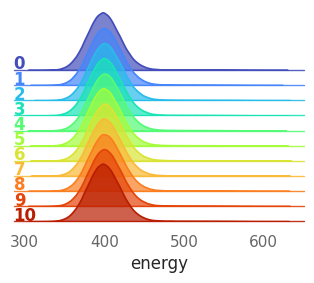

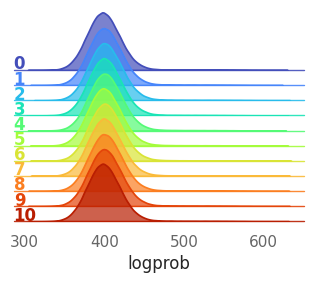

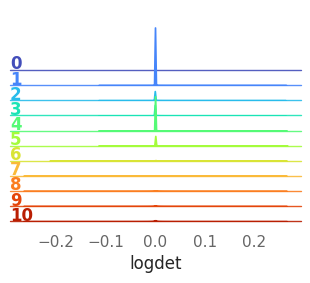

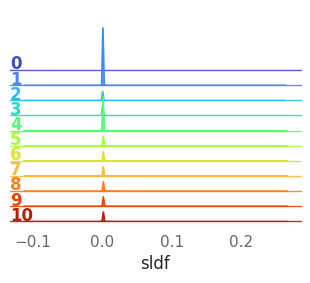

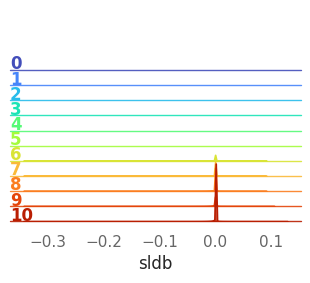

...

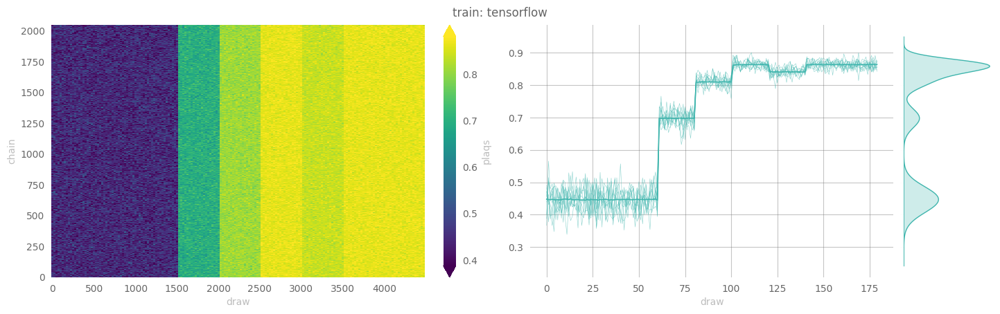

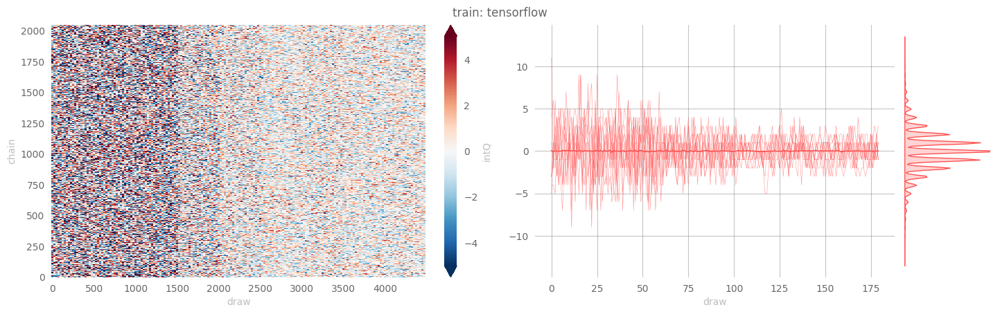

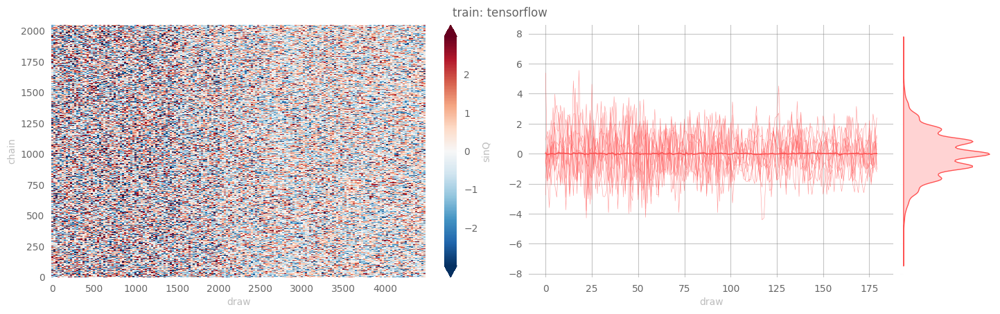

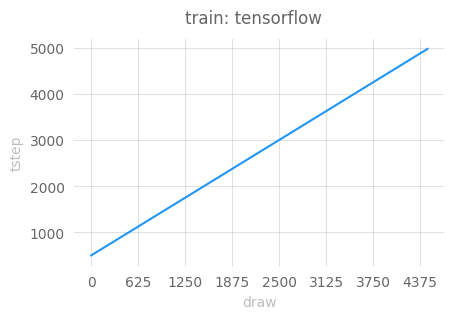

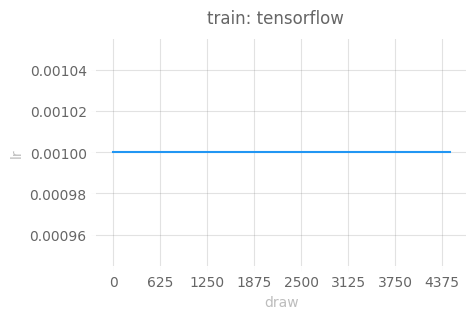

In [30]:
beta = [
    1.0,
    1.0,
    1.0,
    1.0,
    2.0,
    3.0,
    4.0,
    3.5,
    4.0,
    4.0
]
with sns.plotting_context("talk"):
    outputs['tensorflow']['train'] = tfExpU1.train(beta=beta)

[10/21/22 10:59:11] WARNING  x.shape (original): (2048, 2, 16, 16)

                    WARNING  x[:nchains].shape: (16, 2, 16, 16)

                    INFO     eps = None                                                      
                             beta = 5.0                                                      
                             nlog = 10                                                       
                             table = <rich.table.Table object at 0x7f4dc02c7df0>             
                             nprint = 40                                                     
                             eval_steps = 2000                                               
                             nleapfrog = None

[10/21/22 10:59:16] INFO     estep=0   dt=4.4899 beta=5.0000 loss=-480.7741 dQsin=1.4085     
                             dQint=3.8125 energy=1545.0403 logprob=1545.0419 logdet=-0.0015  
                             sldf=0.0002 sldb=-0.0017 sld=-0.0015 xeps=0.2095 veps=0.1959    
                             acc=0.6459 sumlogdet=-0.0000 acc_mask=0.6250 plaqs=-0.0090      
                             intQ=-0.6250 sinQ=0.0636

[10/21/22 10:59:21] INFO     estep=40  dt=0.0191 beta=5.0000 loss=6.5180 dQsin=0.0694        
                             dQint=0.0000 energy=399.5977 logprob=399.5984 logdet=-0.0008    
                             sldf=-0.0008 sldb=-0.0000 sld=-0.0008 xeps=0.2095 veps=0.1959   
                             acc=0.3312 sumlogdet=-0.0011 acc_mask=0.3750 plaqs=0.8902       
                             intQ=0.2500 sinQ=0.1451

[10/21/22 10:59:22] INFO     estep=80  dt=0.0191 beta=5.0000 loss=2.1650 dQsin=0.1721        
                             dQint=0.1250 energy=395.4515 logprob=395.4511 logdet=0.0004     
                             sldf=0.0006 sldb=-0.0002 sld=0.0004 xeps=0.2095 veps=0.1959     
                             acc=0.4823 sumlogdet=0.0000 acc_mask=0.4375 plaqs=0.8935        
                             intQ=0.4375 sinQ=0.4271

[10/21/22 10:59:23] INFO     estep=120 dt=0.0188 beta=5.0000 loss=4.5446 dQsin=0.0960        
                             dQint=0.0000 energy=403.8182 logprob=403.8208 logdet=-0.0025    
                             sldf=-0.0024 sldb=-0.0002 sld=-0.0025 xeps=0.2095 veps=0.1959   
                             acc=0.4887 sumlogdet=-0.0006 acc_mask=0.4375 plaqs=0.8916       
                             intQ=-0.1250 sinQ=-0.1167

[10/21/22 10:59:24] INFO     estep=160 dt=0.0193 beta=5.0000 loss=8.2604 dQsin=0.0966        
                             dQint=0.0000 energy=391.0598 logprob=391.0586 logdet=0.0012     
                             sldf=0.0017 sldb=-0.0005 sld=0.0012 xeps=0.2095 veps=0.1959     
                             acc=0.5162 sumlogdet=0.0008 acc_mask=0.5000 plaqs=0.8952        
                             intQ=-0.1875 sinQ=-0.2067

[10/21/22 10:59:25] INFO     estep=200 dt=0.0192 beta=5.0000 loss=10.6667 dQsin=0.0259       
                             dQint=0.0000 energy=397.0823 logprob=397.0824 logdet=-0.0001    
                             sldf=0.0001 sldb=-0.0002 sld=-0.0001 xeps=0.2095 veps=0.1959    
                             acc=0.4635 sumlogdet=-0.0001 acc_mask=0.3125 plaqs=0.8968       
                             intQ=-0.1875 sinQ=-0.1563

[10/21/22 10:59:26] INFO     estep=240 dt=0.0191 beta=5.0000 loss=18.6119 dQsin=0.0716       
                             dQint=0.0000 energy=393.9893 logprob=393.9892 logdet=0.0001     
                             sldf=0.0001 sldb=-0.0001 sld=0.0001 xeps=0.2095 veps=0.1959     
                             acc=0.5316 sumlogdet=-0.0000 acc_mask=0.5625 plaqs=0.8932       
                             intQ=-0.5000 sinQ=-0.4395

[10/21/22 10:59:27] INFO     estep=280 dt=0.0216 beta=5.0000 loss=6.8341 dQsin=0.0796        
                             dQint=0.0000 energy=395.7874 logprob=395.7856 logdet=0.0018     
                             sldf=0.0015 sldb=0.0003 sld=0.0018 xeps=0.2095 veps=0.1959      
                             acc=0.4416 sumlogdet=0.0016 acc_mask=0.4375 plaqs=0.8927        
                             intQ=-0.1875 sinQ=-0.1687

[10/21/22 10:59:29] INFO     estep=320 dt=0.0189 beta=5.0000 loss=22.6654 dQsin=0.0448       
                             dQint=0.0000 energy=397.9936 logprob=397.9906 logdet=0.0029     
                             sldf=0.0026 sldb=0.0003 sld=0.0029 xeps=0.2095 veps=0.1959      
                             acc=0.3817 sumlogdet=0.0029 acc_mask=0.2500 plaqs=0.8946        
                             intQ=0.1875 sinQ=0.1032

[10/21/22 10:59:30] INFO     estep=360 dt=0.0204 beta=5.0000 loss=7.2979 dQsin=0.0428        
                             dQint=0.0000 energy=401.0596 logprob=401.0590 logdet=0.0006     
                             sldf=0.0006 sldb=0.0000 sld=0.0006 xeps=0.2095 veps=0.1959      
                             acc=0.3881 sumlogdet=-0.0004 acc_mask=0.4375 plaqs=0.8951       
                             intQ=0.1250 sinQ=0.1239

[10/21/22 10:59:31] INFO     estep=400 dt=0.0191 beta=5.0000 loss=18.2660 dQsin=0.0418       
                             dQint=0.0000 energy=401.7384 logprob=401.7386 logdet=-0.0002    
                             sldf=-0.0001 sldb=-0.0001 sld=-0.0002 xeps=0.2095 veps=0.1959   
                             acc=0.2502 sumlogdet=-0.0003 acc_mask=0.2500 plaqs=0.8947       
                             intQ=0.3750 sinQ=0.2870

[10/21/22 10:59:32] INFO     estep=440 dt=0.0192 beta=5.0000 loss=12.2025 dQsin=0.0408       
                             dQint=0.0000 energy=395.9095 logprob=395.9080 logdet=0.0015     
                             sldf=0.0015 sldb=0.0000 sld=0.0015 xeps=0.2095 veps=0.1959      
                             acc=0.3341 sumlogdet=0.0000 acc_mask=0.3125 plaqs=0.8955        
                             intQ=0.3750 sinQ=0.3435

[10/21/22 10:59:33] INFO     estep=480 dt=0.0191 beta=5.0000 loss=9.7987 dQsin=0.0396        
                             dQint=0.0000 energy=393.6156 logprob=393.6173 logdet=-0.0017    
                             sldf=-0.0000 sldb=-0.0017 sld=-0.0017 xeps=0.2095 veps=0.1959   
                             acc=0.4764 sumlogdet=-0.0022 acc_mask=0.3750 plaqs=0.8934       
                             intQ=0.3125 sinQ=0.2660

[10/21/22 10:59:34] INFO     estep=520 dt=0.0192 beta=5.0000 loss=10.0072 dQsin=0.0826       
                             dQint=0.0000 energy=399.1753 logprob=399.1752 logdet=0.0001     
                             sldf=0.0001 sldb=-0.0000 sld=0.0001 xeps=0.2095 veps=0.1959     
                             acc=0.4016 sumlogdet=-0.0003 acc_mask=0.4375 plaqs=0.8913       
                             intQ=0.1875 sinQ=0.1074

[10/21/22 10:59:35] INFO     estep=560 dt=0.0193 beta=5.0000 loss=8.7083 dQsin=0.0605        
                             dQint=0.0000 energy=398.5522 logprob=398.5518 logdet=0.0004     
                             sldf=0.0004 sldb=-0.0001 sld=0.0004 xeps=0.2095 veps=0.1959     
                             acc=0.4202 sumlogdet=-0.0010 acc_mask=0.3750 plaqs=0.8916       
                             intQ=-0.2500 sinQ=-0.2122

[10/21/22 10:59:36] INFO     estep=600 dt=0.0191 beta=5.0000 loss=27.8753 dQsin=0.0444       
                             dQint=0.0000 energy=392.5186 logprob=392.5192 logdet=-0.0006    
                             sldf=0.0000 sldb=-0.0006 sld=-0.0006 xeps=0.2095 veps=0.1959    
                             acc=0.3316 sumlogdet=-0.0018 acc_mask=0.3125 plaqs=0.8949       
                             intQ=-0.0625 sinQ=-0.0938

[10/21/22 10:59:37] INFO     estep=640 dt=0.0192 beta=5.0000 loss=-3.5032 dQsin=0.1376       
                             dQint=0.1250 energy=390.9673 logprob=390.9675 logdet=-0.0002    
                             sldf=-0.0002 sldb=0.0000 sld=-0.0002 xeps=0.2095 veps=0.1959    
                             acc=0.6301 sumlogdet=-0.0004 acc_mask=0.5000 plaqs=0.8948       
                             intQ=-0.1250 sinQ=-0.1700

[10/21/22 10:59:38] INFO     estep=680 dt=0.0191 beta=5.0000 loss=8.5880 dQsin=0.0783        
                             dQint=0.0000 energy=394.4979 logprob=394.4963 logdet=0.0015     
                             sldf=0.0009 sldb=0.0006 sld=0.0015 xeps=0.2095 veps=0.1959      
                             acc=0.4556 sumlogdet=0.0020 acc_mask=0.5000 plaqs=0.8965        
                             intQ=-0.2500 sinQ=-0.2687

[10/21/22 10:59:39] INFO     estep=720 dt=0.0191 beta=5.0000 loss=10.2439 dQsin=0.0913       
                             dQint=0.0000 energy=406.5753 logprob=406.5753 logdet=-0.0000    
                             sldf=-0.0000 sldb=0.0000 sld=-0.0000 xeps=0.2095 veps=0.1959    
                             acc=0.4044 sumlogdet=-0.0000 acc_mask=0.5625 plaqs=0.8924       
                             intQ=0.0625 sinQ=0.0582

[10/21/22 10:59:40] INFO     estep=760 dt=0.0196 beta=5.0000 loss=30.5396 dQsin=0.0275       
                             dQint=0.0000 energy=398.9127 logprob=398.9131 logdet=-0.0003    
                             sldf=-0.0002 sldb=-0.0001 sld=-0.0003 xeps=0.2095 veps=0.1959   
                             acc=0.3336 sumlogdet=-0.0011 acc_mask=0.3750 plaqs=0.8942       
                             intQ=0.4375 sinQ=0.3807

[10/21/22 10:59:41] INFO     estep=800 dt=0.0193 beta=5.0000 loss=12.2995 dQsin=0.0789       
                             dQint=0.0625 energy=397.4903 logprob=397.4857 logdet=0.0045     
                             sldf=0.0048 sldb=-0.0002 sld=0.0045 xeps=0.2095 veps=0.1959     
                             acc=0.4514 sumlogdet=-0.0000 acc_mask=0.4375 plaqs=0.8944       
                             intQ=0.5000 sinQ=0.4383

[10/21/22 10:59:42] INFO     estep=840 dt=0.0192 beta=5.0000 loss=1.3070 dQsin=0.0520        
                             dQint=0.0000 energy=403.3433 logprob=403.3427 logdet=0.0007     
                             sldf=0.0008 sldb=-0.0002 sld=0.0007 xeps=0.2095 veps=0.1959     
                             acc=0.3790 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8926        
                             intQ=0.1875 sinQ=0.1225

[10/21/22 10:59:43] INFO     estep=880 dt=0.0192 beta=5.0000 loss=5.2895 dQsin=0.0701        
                             dQint=0.0625 energy=394.8098 logprob=394.8096 logdet=0.0003     
                             sldf=0.0008 sldb=-0.0005 sld=0.0003 xeps=0.2095 veps=0.1959     
                             acc=0.3416 sumlogdet=0.0002 acc_mask=0.2500 plaqs=0.8941        
                             intQ=0.1875 sinQ=0.1890

[10/21/22 10:59:44] INFO     estep=920 dt=0.0193 beta=5.0000 loss=3.4021 dQsin=0.0190        
                             dQint=0.0000 energy=403.8674 logprob=403.8672 logdet=0.0001     
                             sldf=-0.0001 sldb=0.0002 sld=0.0001 xeps=0.2095 veps=0.1959     
                             acc=0.3451 sumlogdet=-0.0000 acc_mask=0.1250 plaqs=0.8898       
                             intQ=-0.1875 sinQ=-0.0892

[10/21/22 10:59:45] INFO     estep=960 dt=0.0192 beta=5.0000 loss=6.3082 dQsin=0.0766        
                             dQint=0.0000 energy=396.1243 logprob=396.1229 logdet=0.0014     
                             sldf=0.0014 sldb=0.0000 sld=0.0014 xeps=0.2095 veps=0.1959      
                             acc=0.4062 sumlogdet=0.0010 acc_mask=0.5625 plaqs=0.8908        
                             intQ=-0.1250 sinQ=-0.1227

[10/21/22 10:59:46] INFO     estep=1000 dt=0.0192 beta=5.0000 loss=10.4097 dQsin=0.0871      
                             dQint=0.0000 energy=395.8319 logprob=395.8314 logdet=0.0005     
                             sldf=0.0005 sldb=0.0000 sld=0.0005 xeps=0.2095 veps=0.1959      
                             acc=0.4663 sumlogdet=0.0010 acc_mask=0.4375 plaqs=0.8926        
                             intQ=0.1875 sinQ=0.2016

[10/21/22 10:59:47] INFO     estep=1040 dt=0.0191 beta=5.0000 loss=15.4270 dQsin=0.0509      
                             dQint=0.0000 energy=395.1626 logprob=395.1629 logdet=-0.0002    
                             sldf=0.0000 sldb=-0.0002 sld=-0.0002 xeps=0.2095 veps=0.1959    
                             acc=0.5386 sumlogdet=-0.0013 acc_mask=0.5625 plaqs=0.8959       
                             intQ=0.0625 sinQ=0.0819

[10/21/22 10:59:48] INFO     estep=1080 dt=0.0192 beta=5.0000 loss=13.9518 dQsin=0.0415      
                             dQint=0.0000 energy=398.9396 logprob=398.9384 logdet=0.0013     
                             sldf=0.0013 sldb=-0.0000 sld=0.0013 xeps=0.2095 veps=0.1959     
                             acc=0.4303 sumlogdet=0.0007 acc_mask=0.3750 plaqs=0.8962        
                             intQ=-0.0625 sinQ=-0.0008

[10/21/22 10:59:49] INFO     estep=1120 dt=0.0185 beta=5.0000 loss=12.4429 dQsin=0.1419      
                             dQint=0.0000 energy=392.1831 logprob=392.1831 logdet=0.0001     
                             sldf=0.0004 sldb=-0.0004 sld=0.0001 xeps=0.2095 veps=0.1959     
                             acc=0.4763 sumlogdet=-0.0006 acc_mask=0.7500 plaqs=0.8961       
                             intQ=0.0000 sinQ=-0.0574

[10/21/22 10:59:50] INFO     estep=1160 dt=0.0192 beta=5.0000 loss=0.1207 dQsin=0.0940       
                             dQint=0.0625 energy=395.0146 logprob=395.0137 logdet=0.0009     
                             sldf=0.0009 sldb=-0.0000 sld=0.0009 xeps=0.2095 veps=0.1959     
                             acc=0.3411 sumlogdet=-0.0000 acc_mask=0.4375 plaqs=0.8940       
                             intQ=-0.0625 sinQ=-0.0583

[10/21/22 10:59:51] INFO     estep=1200 dt=0.0194 beta=5.0000 loss=3.0252 dQsin=0.1236       
                             dQint=0.0625 energy=398.8172 logprob=398.8174 logdet=-0.0002    
                             sldf=0.0000 sldb=-0.0002 sld=-0.0002 xeps=0.2095 veps=0.1959    
                             acc=0.3957 sumlogdet=-0.0005 acc_mask=0.5000 plaqs=0.8934       
                             intQ=-0.3125 sinQ=-0.2488

[10/21/22 10:59:52] INFO     estep=1240 dt=0.0193 beta=5.0000 loss=-3.5522 dQsin=0.1761      
                             dQint=0.1250 energy=390.7951 logprob=390.7959 logdet=-0.0008    
                             sldf=-0.0008 sldb=0.0000 sld=-0.0008 xeps=0.2095 veps=0.1959    
                             acc=0.4676 sumlogdet=0.0005 acc_mask=0.5000 plaqs=0.8977        
                             intQ=-0.4375 sinQ=-0.3957

[10/21/22 10:59:53] INFO     estep=1280 dt=0.0192 beta=5.0000 loss=15.4668 dQsin=0.0801      
                             dQint=0.0625 energy=399.6199 logprob=399.6200 logdet=-0.0000    
                             sldf=0.0000 sldb=-0.0001 sld=-0.0000 xeps=0.2095 veps=0.1959    
                             acc=0.4208 sumlogdet=-0.0012 acc_mask=0.5625 plaqs=0.8938       
                             intQ=0.1250 sinQ=0.1399

[10/21/22 10:59:54] INFO     estep=1320 dt=0.0191 beta=5.0000 loss=13.4525 dQsin=0.0411      
                             dQint=0.0000 energy=400.6338 logprob=400.6333 logdet=0.0004     
                             sldf=0.0004 sldb=-0.0000 sld=0.0004 xeps=0.2095 veps=0.1959     
                             acc=0.4605 sumlogdet=0.0000 acc_mask=0.3125 plaqs=0.8910        
                             intQ=0.0000 sinQ=-0.0162

[10/21/22 10:59:55] INFO     estep=1360 dt=0.0193 beta=5.0000 loss=23.0592 dQsin=0.0255      
                             dQint=0.0000 energy=395.2906 logprob=395.2899 logdet=0.0007     
                             sldf=0.0009 sldb=-0.0001 sld=0.0007 xeps=0.2095 veps=0.1959     
                             acc=0.4386 sumlogdet=-0.0000 acc_mask=0.3125 plaqs=0.8915       
                             intQ=0.1250 sinQ=0.0558

[10/21/22 10:59:56] INFO     estep=1400 dt=0.0192 beta=5.0000 loss=7.4531 dQsin=0.1270       
                             dQint=0.0000 energy=394.2107 logprob=394.2101 logdet=0.0006     
                             sldf=0.0007 sldb=-0.0000 sld=0.0006 xeps=0.2095 veps=0.1959     
                             acc=0.4324 sumlogdet=-0.0013 acc_mask=0.5000 plaqs=0.8886       
                             intQ=0.1875 sinQ=0.2025

[10/21/22 10:59:57] INFO     estep=1440 dt=0.0192 beta=5.0000 loss=12.8980 dQsin=0.0715      
                             dQint=0.0000 energy=400.9694 logprob=400.9690 logdet=0.0004     
                             sldf=0.0004 sldb=-0.0000 sld=0.0004 xeps=0.2095 veps=0.1959     
                             acc=0.5129 sumlogdet=0.0007 acc_mask=0.6250 plaqs=0.8930        
                             intQ=0.0000 sinQ=0.0153

[10/21/22 10:59:58] INFO     estep=1480 dt=0.0192 beta=5.0000 loss=-1.8063 dQsin=0.1699      
                             dQint=0.0625 energy=407.1026 logprob=407.1023 logdet=0.0003     
                             sldf=0.0008 sldb=-0.0005 sld=0.0003 xeps=0.2095 veps=0.1959     
                             acc=0.5076 sumlogdet=0.0008 acc_mask=0.5625 plaqs=0.8893        
                             intQ=-0.1875 sinQ=-0.0722

[10/21/22 10:59:59] INFO     estep=1520 dt=0.0192 beta=5.0000 loss=13.0862 dQsin=0.1144      
                             dQint=0.0625 energy=393.8587 logprob=393.8593 logdet=-0.0006    
                             sldf=-0.0005 sldb=-0.0001 sld=-0.0006 xeps=0.2095 veps=0.1959   
                             acc=0.5086 sumlogdet=-0.0001 acc_mask=0.5625 plaqs=0.8939       
                             intQ=-0.2500 sinQ=-0.2342

[10/21/22 11:00:00] INFO     estep=1560 dt=0.0193 beta=5.0000 loss=7.2076 dQsin=0.0471       
                             dQint=0.0000 energy=398.5426 logprob=398.5415 logdet=0.0011     
                             sldf=0.0008 sldb=0.0003 sld=0.0011 xeps=0.2095 veps=0.1959      
                             acc=0.3994 sumlogdet=0.0036 acc_mask=0.3750 plaqs=0.8952        
                             intQ=-0.1250 sinQ=-0.1059

[10/21/22 11:00:01] INFO     estep=1600 dt=0.0193 beta=5.0000 loss=1.0101 dQsin=0.1094       
                             dQint=0.0625 energy=382.0588 logprob=382.0588 logdet=-0.0000    
                             sldf=0.0000 sldb=-0.0000 sld=-0.0000 xeps=0.2095 veps=0.1959    
                             acc=0.6887 sumlogdet=-0.0000 acc_mask=0.7500 plaqs=0.8959       
                             intQ=-0.0625 sinQ=-0.0676

[10/21/22 11:00:03] INFO     estep=1640 dt=0.0211 beta=5.0000 loss=10.9743 dQsin=0.0670      
                             dQint=0.0000 energy=402.8431 logprob=402.8427 logdet=0.0005     
                             sldf=0.0005 sldb=0.0000 sld=0.0005 xeps=0.2095 veps=0.1959      
                             acc=0.4448 sumlogdet=0.0006 acc_mask=0.3750 plaqs=0.8917        
                             intQ=-0.1875 sinQ=-0.1927

[10/21/22 11:00:04] INFO     estep=1680 dt=0.0192 beta=5.0000 loss=9.6270 dQsin=0.1062       
                             dQint=0.0000 energy=391.0310 logprob=391.0314 logdet=-0.0004    
                             sldf=-0.0000 sldb=-0.0004 sld=-0.0004 xeps=0.2095 veps=0.1959   
                             acc=0.5692 sumlogdet=0.0000 acc_mask=0.5000 plaqs=0.8949        
                             intQ=-0.3750 sinQ=-0.2773

[10/21/22 11:00:05] INFO     estep=1720 dt=0.0193 beta=5.0000 loss=11.2991 dQsin=0.0342      
                             dQint=0.0000 energy=398.0542 logprob=398.0529 logdet=0.0012     
                             sldf=0.0015 sldb=-0.0002 sld=0.0012 xeps=0.2095 veps=0.1959     
                             acc=0.4896 sumlogdet=-0.0005 acc_mask=0.3750 plaqs=0.8919       
                             intQ=-0.2500 sinQ=-0.2986

[10/21/22 11:00:06] INFO     estep=1760 dt=0.0193 beta=5.0000 loss=6.9306 dQsin=0.0833       
                             dQint=0.0000 energy=396.3936 logprob=396.3932 logdet=0.0004     
                             sldf=0.0006 sldb=-0.0002 sld=0.0004 xeps=0.2095 veps=0.1959     
                             acc=0.4346 sumlogdet=-0.0000 acc_mask=0.3750 plaqs=0.8940       
                             intQ=0.1250 sinQ=0.0391

[10/21/22 11:00:07] INFO     estep=1800 dt=0.0193 beta=5.0000 loss=17.8536 dQsin=0.0422      
                             dQint=0.0000 energy=400.8897 logprob=400.8898 logdet=-0.0001    
                             sldf=-0.0000 sldb=-0.0001 sld=-0.0001 xeps=0.2095 veps=0.1959   
                             acc=0.4497 sumlogdet=-0.0000 acc_mask=0.3125 plaqs=0.8939       
                             intQ=-0.1875 sinQ=-0.1707

[10/21/22 11:00:08] INFO     estep=1840 dt=0.0193 beta=5.0000 loss=8.6418 dQsin=0.0505       
                             dQint=0.0000 energy=405.1954 logprob=405.1948 logdet=0.0006     
                             sldf=0.0007 sldb=-0.0001 sld=0.0006 xeps=0.2095 veps=0.1959     
                             acc=0.5233 sumlogdet=0.0002 acc_mask=0.4375 plaqs=0.8885        
                             intQ=-0.1250 sinQ=-0.1445

[10/21/22 11:00:09] INFO     estep=1880 dt=0.0193 beta=5.0000 loss=7.8381 dQsin=0.1034       
                             dQint=0.0000 energy=400.2939 logprob=400.2939 logdet=-0.0001    
                             sldf=0.0000 sldb=-0.0001 sld=-0.0001 xeps=0.2095 veps=0.1959    
                             acc=0.4741 sumlogdet=-0.0001 acc_mask=0.5000 plaqs=0.8918       
                             intQ=-0.2500 sinQ=-0.2508

[10/21/22 11:00:10] INFO     estep=1920 dt=0.0189 beta=5.0000 loss=3.9339 dQsin=0.0615       
                             dQint=0.0625 energy=398.8387 logprob=398.8391 logdet=-0.0004    
                             sldf=-0.0004 sldb=0.0000 sld=-0.0004 xeps=0.2095 veps=0.1959    
                             acc=0.3719 sumlogdet=0.0003 acc_mask=0.3750 plaqs=0.8923        
                             intQ=-0.1875 sinQ=-0.1470

[10/21/22 11:00:11] INFO     estep=1960 dt=0.0194 beta=5.0000 loss=5.9338 dQsin=0.1874       
                             dQint=0.1250 energy=397.4528 logprob=397.4516 logdet=0.0012     
                             sldf=0.0012 sldb=-0.0001 sld=0.0012 xeps=0.2095 veps=0.1959     
                             acc=0.3866 sumlogdet=-0.0014 acc_mask=0.5000 plaqs=0.8940       
                             intQ=0.0625 sinQ=0.1005

[10/21/22 11:00:13] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-102733/tensorflow/eval/plots/ridgeplots/energy_ridgeplot.svg

[10/21/22 11:00:15] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-102733/tensorflow/eval/plots/ridgeplots/logprob_ridgeplot.svg

[10/21/22 11:00:16] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-102733/tensorflow/eval/plots/ridgeplots/logdet_ridgeplot.svg

[10/21/22 11:00:18] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-102733/tensorflow/eval/plots/ridgeplots/sldf_ridgeplot.svg

[10/21/22 11:00:19] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-102733/tensorflow/eval/plots/ridgeplots/sldb_ridgeplot.svg

[10/21/22 11:00:21] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-102733/tensorflow/eval/plots/ridgeplots/sld_ridgeplot.svg

[10/21/22 11:00:33] INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/
                             thetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-
                             21-102733/tensorflow/eval/data/eval_data.h5

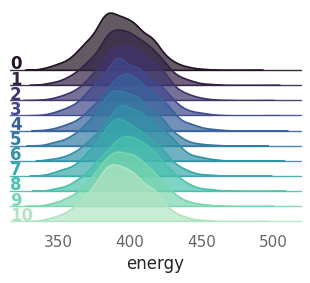

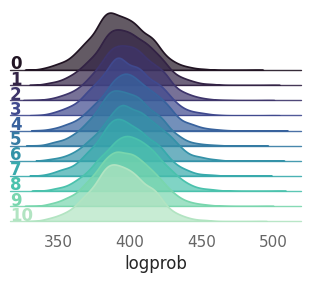

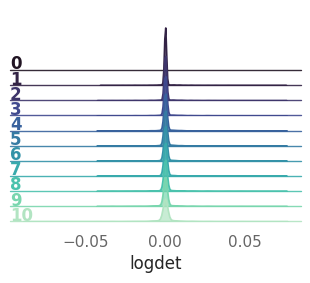

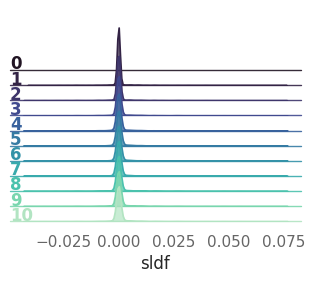

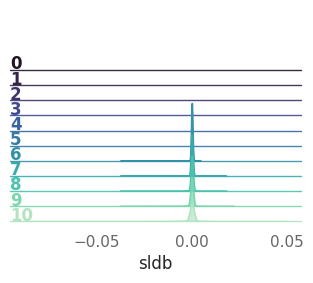

...

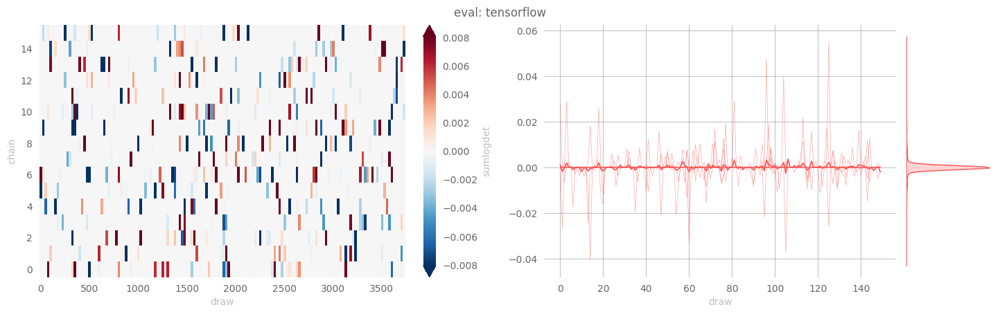

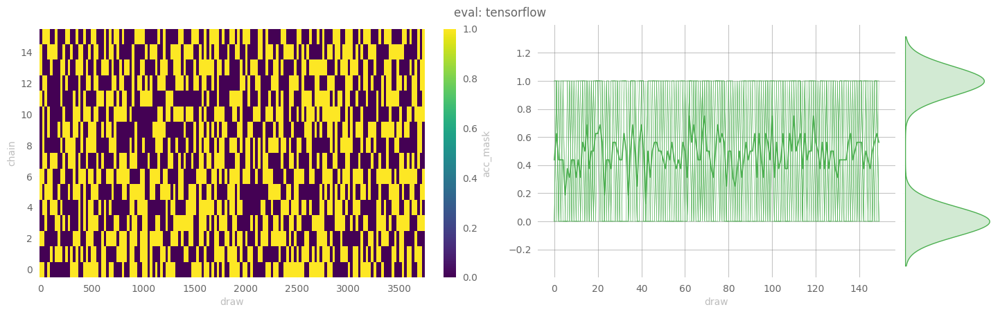

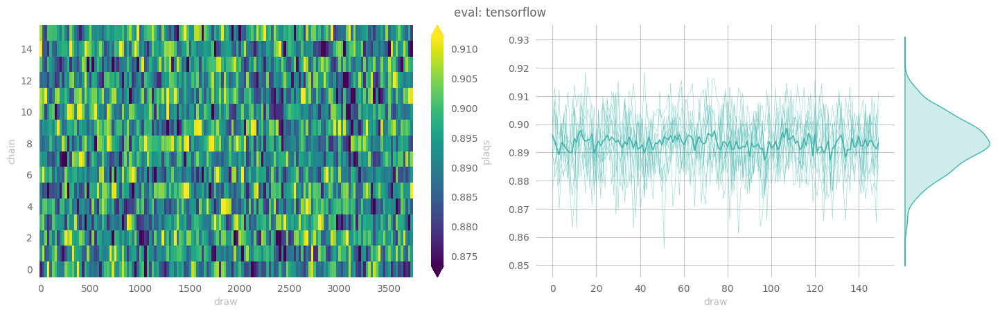

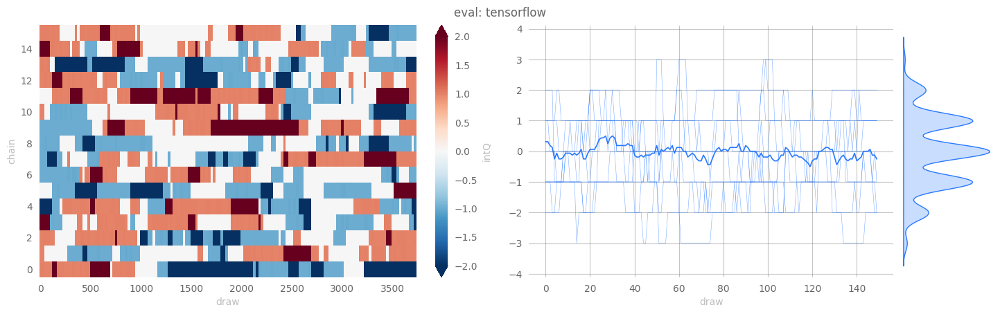

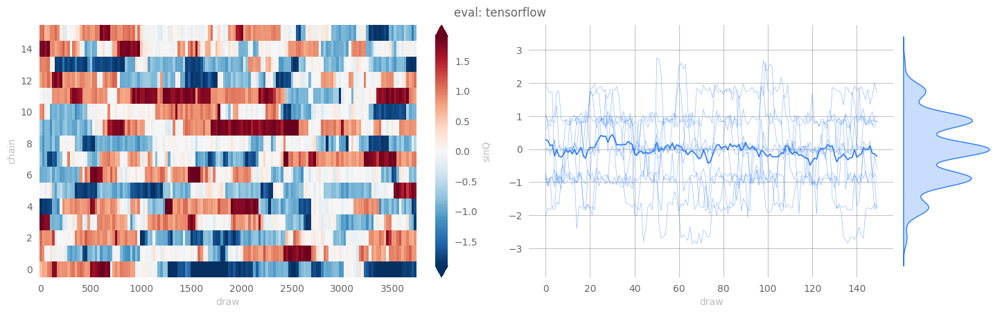

In [31]:
outputs['tensorflow']['eval'] = tfExpU1.evaluate(job_type='eval', nchains=16, therm_frac=0.25)

[10/21/22 11:00:40] WARNING  Step size `eps` not specified for HMC! Using default: 0.2000 for
                             generic HMC

                    WARNING  x.shape (original): (2048, 2, 16, 16)

                    WARNING  x[:nchains].shape: (16, 2, 16, 16)

                    INFO     eps = 0.2                                                       
                             beta = 5.0                                                      
                             nlog = 10                                                       
                             table = <rich.table.Table object at 0x7f4d6dd96f70>             
                             nprint = 40                                                     
                             eval_steps = 2000                                               
                             nleapfrog = 10

                    INFO     hstep=0   dt=0.0764 beta=5.0000 loss=-766.3447 dQsin=2.1631     
                             dQint=5.3750 energy=1528.4698 logprob=1528.4698 logdet=0.0000   
                             acc=1.0000 sumlogdet=0.0000 acc_mask=1.0000 plaqs=-0.0249       
                             intQ=-0.0625 sinQ=0.0432

[10/21/22 11:00:43] INFO     hstep=40  dt=0.0657 beta=5.0000 loss=12.3620 dQsin=0.0557       
                             dQint=0.0000 energy=408.0593 logprob=408.0593 logdet=0.0000     
                             acc=0.3357 sumlogdet=0.0000 acc_mask=0.3750 plaqs=0.8810        
                             intQ=0.1875 sinQ=0.0694

[10/21/22 11:00:46] INFO     hstep=80  dt=0.0656 beta=5.0000 loss=26.3105 dQsin=0.0211       
                             dQint=0.0000 energy=411.5009 logprob=411.5009 logdet=0.0000     
                             acc=0.2945 sumlogdet=0.0000 acc_mask=0.2500 plaqs=0.8877        
                             intQ=0.1250 sinQ=0.0412

[10/21/22 11:00:49] INFO     hstep=120 dt=0.0657 beta=5.0000 loss=25.5086 dQsin=0.0733       
                             dQint=0.0625 energy=393.3416 logprob=393.3416 logdet=0.0000     
                             acc=0.2604 sumlogdet=0.0000 acc_mask=0.2500 plaqs=0.8907        
                             intQ=-0.0625 sinQ=-0.0967

[10/21/22 11:00:52] INFO     hstep=160 dt=0.0657 beta=5.0000 loss=51.6338 dQsin=0.0099       
                             dQint=0.0000 energy=405.0038 logprob=405.0038 logdet=0.0000     
                             acc=0.1869 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8905        
                             intQ=-0.0625 sinQ=-0.0069

[10/21/22 11:00:54] INFO     hstep=200 dt=0.0641 beta=5.0000 loss=34.5426 dQsin=0.0561       
                             dQint=0.0000 energy=387.3162 logprob=387.3162 logdet=0.0000     
                             acc=0.2647 sumlogdet=0.0000 acc_mask=0.4375 plaqs=0.8912        
                             intQ=0.0000 sinQ=0.0349

[10/21/22 11:00:57] INFO     hstep=240 dt=0.0639 beta=5.0000 loss=20.1622 dQsin=0.1542       
                             dQint=0.0625 energy=402.6147 logprob=402.6147 logdet=0.0000     
                             acc=0.3042 sumlogdet=0.0000 acc_mask=0.3125 plaqs=0.8891        
                             intQ=-0.0625 sinQ=-0.0904

[10/21/22 11:01:00] INFO     hstep=280 dt=0.0642 beta=5.0000 loss=26.2569 dQsin=0.0264       
                             dQint=0.0000 energy=401.9309 logprob=401.9309 logdet=0.0000     
                             acc=0.2050 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8899        
                             intQ=-0.2500 sinQ=-0.2145

[10/21/22 11:01:03] INFO     hstep=320 dt=0.0640 beta=5.0000 loss=34.2243 dQsin=0.0466       
                             dQint=0.0000 energy=403.7209 logprob=403.7209 logdet=0.0000     
                             acc=0.1061 sumlogdet=0.0000 acc_mask=0.0625 plaqs=0.8908        
                             intQ=-0.5000 sinQ=-0.4286

[10/21/22 11:01:05] INFO     hstep=360 dt=0.0641 beta=5.0000 loss=34.7560 dQsin=0.0491       
                             dQint=0.0625 energy=387.3667 logprob=387.3667 logdet=0.0000     
                             acc=0.1351 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8960        
                             intQ=-0.4375 sinQ=-0.3479

[10/21/22 11:01:08] INFO     hstep=400 dt=0.0638 beta=5.0000 loss=30.6910 dQsin=0.0195       
                             dQint=0.0000 energy=397.8478 logprob=397.8478 logdet=0.0000     
                             acc=0.1846 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8914        
                             intQ=-0.3125 sinQ=-0.2384

[10/21/22 11:01:11] INFO     hstep=440 dt=0.0638 beta=5.0000 loss=30.0410 dQsin=0.0406       
                             dQint=0.0000 energy=393.8783 logprob=393.8783 logdet=0.0000     
                             acc=0.1655 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8956        
                             intQ=-0.3125 sinQ=-0.2075

[10/21/22 11:01:14] INFO     hstep=480 dt=0.0640 beta=5.0000 loss=25.1525 dQsin=0.0267       
                             dQint=0.0000 energy=400.6572 logprob=400.6572 logdet=0.0000     
                             acc=0.2070 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8941        
                             intQ=-0.3750 sinQ=-0.3332

[10/21/22 11:01:17] INFO     hstep=520 dt=0.0669 beta=5.0000 loss=40.5300 dQsin=0.0000       
                             dQint=0.0000 energy=392.6388 logprob=392.6388 logdet=0.0000     
                             acc=0.0902 sumlogdet=0.0000 acc_mask=0.0000 plaqs=0.8936        
                             intQ=-0.5625 sinQ=-0.4860

[10/21/22 11:01:19] INFO     hstep=560 dt=0.0630 beta=5.0000 loss=25.4227 dQsin=0.0705       
                             dQint=0.0000 energy=393.1237 logprob=393.1237 logdet=0.0000     
                             acc=0.1979 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8932        
                             intQ=-0.6250 sinQ=-0.5780

[10/21/22 11:01:22] INFO     hstep=600 dt=0.0629 beta=5.0000 loss=40.3638 dQsin=0.0062       
                             dQint=0.0000 energy=396.6091 logprob=396.6091 logdet=0.0000     
                             acc=0.1177 sumlogdet=0.0000 acc_mask=0.0625 plaqs=0.8941        
                             intQ=-0.6875 sinQ=-0.6253

[10/21/22 11:01:25] INFO     hstep=640 dt=0.0630 beta=5.0000 loss=51.5699 dQsin=0.0223       
                             dQint=0.0000 energy=395.7109 logprob=395.7109 logdet=0.0000     
                             acc=0.1617 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8938        
                             intQ=-0.6250 sinQ=-0.6002

[10/21/22 11:01:27] INFO     hstep=680 dt=0.0630 beta=5.0000 loss=48.0740 dQsin=0.0326       
                             dQint=0.0000 energy=396.7917 logprob=396.7917 logdet=0.0000     
                             acc=0.2038 sumlogdet=0.0000 acc_mask=0.3125 plaqs=0.8949        
                             intQ=-0.5000 sinQ=-0.4935

[10/21/22 11:01:30] INFO     hstep=720 dt=0.0632 beta=5.0000 loss=24.9292 dQsin=0.0277       
                             dQint=0.0000 energy=397.3125 logprob=397.3125 logdet=0.0000     
                             acc=0.4608 sumlogdet=0.0000 acc_mask=0.3750 plaqs=0.8906        
                             intQ=-0.5000 sinQ=-0.4269

[10/21/22 11:01:33] INFO     hstep=760 dt=0.0633 beta=5.0000 loss=31.7118 dQsin=0.0430       
                             dQint=0.0000 energy=399.2759 logprob=399.2759 logdet=0.0000     
                             acc=0.1857 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8925        
                             intQ=-0.5000 sinQ=-0.3617

[10/21/22 11:01:35] INFO     hstep=800 dt=0.0633 beta=5.0000 loss=33.4558 dQsin=0.0546       
                             dQint=0.0000 energy=399.5260 logprob=399.5260 logdet=0.0000     
                             acc=0.2576 sumlogdet=0.0000 acc_mask=0.3125 plaqs=0.8935        
                             intQ=-0.5625 sinQ=-0.4852

[10/21/22 11:01:38] INFO     hstep=840 dt=0.0636 beta=5.0000 loss=24.2461 dQsin=0.0358       
                             dQint=0.0000 energy=391.7056 logprob=391.7056 logdet=0.0000     
                             acc=0.1830 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8930        
                             intQ=-0.4375 sinQ=-0.3870

[10/21/22 11:01:41] INFO     hstep=880 dt=0.0632 beta=5.0000 loss=41.1868 dQsin=0.0062       
                             dQint=0.0000 energy=398.9814 logprob=398.9814 logdet=0.0000     
                             acc=0.1650 sumlogdet=0.0000 acc_mask=0.0625 plaqs=0.8919        
                             intQ=-0.5000 sinQ=-0.4439

[10/21/22 11:01:44] INFO     hstep=920 dt=0.0632 beta=5.0000 loss=33.7953 dQsin=0.0252       
                             dQint=0.0000 energy=395.6668 logprob=395.6668 logdet=0.0000     
                             acc=0.2078 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8941        
                             intQ=-0.5000 sinQ=-0.4598

[10/21/22 11:01:46] INFO     hstep=960 dt=0.0632 beta=5.0000 loss=39.0108 dQsin=0.0624       
                             dQint=0.0000 energy=393.3195 logprob=393.3195 logdet=0.0000     
                             acc=0.2306 sumlogdet=0.0000 acc_mask=0.3125 plaqs=0.8942        
                             intQ=-0.5000 sinQ=-0.4468

[10/21/22 11:01:49] INFO     hstep=1000 dt=0.0634 beta=5.0000 loss=28.0709 dQsin=0.0117      
                             dQint=0.0000 energy=396.8146 logprob=396.8146 logdet=0.0000     
                             acc=0.1496 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8943        
                             intQ=-0.5000 sinQ=-0.4316

[10/21/22 11:01:52] INFO     hstep=1040 dt=0.0635 beta=5.0000 loss=23.8101 dQsin=0.0779      
                             dQint=0.0000 energy=396.3092 logprob=396.3092 logdet=0.0000     
                             acc=0.2257 sumlogdet=0.0000 acc_mask=0.2500 plaqs=0.8940        
                             intQ=-0.6250 sinQ=-0.5854

[10/21/22 11:01:55] INFO     hstep=1080 dt=0.0632 beta=5.0000 loss=27.5313 dQsin=0.0491      
                             dQint=0.0000 energy=398.1046 logprob=398.1046 logdet=0.0000     
                             acc=0.3185 sumlogdet=0.0000 acc_mask=0.3125 plaqs=0.8906        
                             intQ=-0.7500 sinQ=-0.6599

[10/21/22 11:01:57] INFO     hstep=1120 dt=0.0631 beta=5.0000 loss=35.2750 dQsin=0.0238      
                             dQint=0.0000 energy=386.7863 logprob=386.7863 logdet=0.0000     
                             acc=0.1241 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8954        
                             intQ=-0.6250 sinQ=-0.5926

[10/21/22 11:02:00] INFO     hstep=1160 dt=0.0631 beta=5.0000 loss=36.5802 dQsin=0.0135      
                             dQint=0.0000 energy=396.2201 logprob=396.2201 logdet=0.0000     
                             acc=0.2398 sumlogdet=0.0000 acc_mask=0.2500 plaqs=0.8928        
                             intQ=-0.6250 sinQ=-0.5279

[10/21/22 11:02:03] INFO     hstep=1200 dt=0.0631 beta=5.0000 loss=32.4112 dQsin=0.0371      
                             dQint=0.0000 energy=394.6573 logprob=394.6573 logdet=0.0000     
                             acc=0.2600 sumlogdet=0.0000 acc_mask=0.3125 plaqs=0.8935        
                             intQ=-0.6250 sinQ=-0.5350

[10/21/22 11:02:05] INFO     hstep=1240 dt=0.0631 beta=5.0000 loss=32.5031 dQsin=0.0062      
                             dQint=0.0000 energy=394.2517 logprob=394.2517 logdet=0.0000     
                             acc=0.1145 sumlogdet=0.0000 acc_mask=0.0625 plaqs=0.8947        
                             intQ=-0.6875 sinQ=-0.6144

[10/21/22 11:02:08] INFO     hstep=1280 dt=0.0630 beta=5.0000 loss=18.0232 dQsin=0.0463      
                             dQint=0.0000 energy=402.7843 logprob=402.7843 logdet=0.0000     
                             acc=0.2422 sumlogdet=0.0000 acc_mask=0.3125 plaqs=0.8909        
                             intQ=-0.6875 sinQ=-0.6072

[10/21/22 11:02:11] INFO     hstep=1320 dt=0.0629 beta=5.0000 loss=34.3215 dQsin=0.0324      
                             dQint=0.0000 energy=394.7947 logprob=394.7947 logdet=0.0000     
                             acc=0.1906 sumlogdet=0.0000 acc_mask=0.3125 plaqs=0.8898        
                             intQ=-0.5625 sinQ=-0.5382

[10/21/22 11:02:13] INFO     hstep=1360 dt=0.0631 beta=5.0000 loss=25.0714 dQsin=0.0648      
                             dQint=0.0000 energy=396.9727 logprob=396.9727 logdet=0.0000     
                             acc=0.3272 sumlogdet=0.0000 acc_mask=0.3750 plaqs=0.8930        
                             intQ=-0.5625 sinQ=-0.4498

[10/21/22 11:02:16] INFO     hstep=1400 dt=0.0633 beta=5.0000 loss=28.9241 dQsin=0.0404      
                             dQint=0.0625 energy=395.7778 logprob=395.7778 logdet=0.0000     
                             acc=0.1947 sumlogdet=0.0000 acc_mask=0.2500 plaqs=0.8955        
                             intQ=-0.6875 sinQ=-0.5411

[10/21/22 11:02:19] INFO     hstep=1440 dt=0.0633 beta=5.0000 loss=52.2312 dQsin=0.0066      
                             dQint=0.0000 energy=403.2992 logprob=403.2992 logdet=0.0000     
                             acc=0.0915 sumlogdet=0.0000 acc_mask=0.0625 plaqs=0.8951        
                             intQ=-0.6250 sinQ=-0.6201

[10/21/22 11:02:22] INFO     hstep=1480 dt=0.0633 beta=5.0000 loss=42.9662 dQsin=0.0583      
                             dQint=0.0000 energy=394.0354 logprob=394.0354 logdet=0.0000     
                             acc=0.2544 sumlogdet=0.0000 acc_mask=0.3125 plaqs=0.8939        
                             intQ=-0.7500 sinQ=-0.6668

[10/21/22 11:02:24] INFO     hstep=1520 dt=0.0631 beta=5.0000 loss=49.8432 dQsin=0.0138      
                             dQint=0.0000 energy=386.2366 logprob=386.2366 logdet=0.0000     
                             acc=0.0823 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8968        
                             intQ=-0.6875 sinQ=-0.6525

[10/21/22 11:02:27] INFO     hstep=1560 dt=0.0632 beta=5.0000 loss=48.8058 dQsin=0.0207      
                             dQint=0.0000 energy=395.1814 logprob=395.1814 logdet=0.0000     
                             acc=0.1094 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8980        
                             intQ=-0.6250 sinQ=-0.5595

[10/21/22 11:02:30] INFO     hstep=1600 dt=0.0633 beta=5.0000 loss=36.0119 dQsin=0.0495      
                             dQint=0.0000 energy=390.4243 logprob=390.4243 logdet=0.0000     
                             acc=0.2541 sumlogdet=0.0000 acc_mask=0.2500 plaqs=0.8954        
                             intQ=-0.6875 sinQ=-0.7086

[10/21/22 11:02:33] INFO     hstep=1640 dt=0.0633 beta=5.0000 loss=19.7677 dQsin=0.0710      
                             dQint=0.0000 energy=399.2797 logprob=399.2797 logdet=0.0000     
                             acc=0.3630 sumlogdet=0.0000 acc_mask=0.3750 plaqs=0.8923        
                             intQ=-0.8125 sinQ=-0.6807

[10/21/22 11:02:35] INFO     hstep=1680 dt=0.0632 beta=5.0000 loss=18.6170 dQsin=0.0503      
                             dQint=0.0000 energy=394.2997 logprob=394.2997 logdet=0.0000     
                             acc=0.2442 sumlogdet=0.0000 acc_mask=0.2500 plaqs=0.8960        
                             intQ=-0.8125 sinQ=-0.7521

[10/21/22 11:02:38] INFO     hstep=1720 dt=0.0631 beta=5.0000 loss=37.8284 dQsin=0.0083      
                             dQint=0.0000 energy=390.9641 logprob=390.9641 logdet=0.0000     
                             acc=0.1609 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8931        
                             intQ=-0.6875 sinQ=-0.6092

[10/21/22 11:02:41] INFO     hstep=1760 dt=0.0630 beta=5.0000 loss=23.9522 dQsin=0.0384      
                             dQint=0.0000 energy=392.5313 logprob=392.5313 logdet=0.0000     
                             acc=0.2577 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8915        
                             intQ=-0.6250 sinQ=-0.6184

[10/21/22 11:02:43] INFO     hstep=1800 dt=0.0632 beta=5.0000 loss=57.2188 dQsin=0.0000      
                             dQint=0.0000 energy=404.5415 logprob=404.5415 logdet=0.0000     
                             acc=0.0474 sumlogdet=0.0000 acc_mask=0.0000 plaqs=0.8927        
                             intQ=-0.6875 sinQ=-0.6330

[10/21/22 11:02:46] INFO     hstep=1840 dt=0.0633 beta=5.0000 loss=43.4878 dQsin=0.0164      
                             dQint=0.0000 energy=397.2234 logprob=397.2234 logdet=0.0000     
                             acc=0.1327 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8930        
                             intQ=-0.8125 sinQ=-0.7116

[10/21/22 11:02:49] INFO     hstep=1880 dt=0.0632 beta=5.0000 loss=41.7435 dQsin=0.0409      
                             dQint=0.0000 energy=393.8690 logprob=393.8690 logdet=0.0000     
                             acc=0.2291 sumlogdet=0.0000 acc_mask=0.1875 plaqs=0.8903        
                             intQ=-0.5625 sinQ=-0.4689

[10/21/22 11:02:51] INFO     hstep=1920 dt=0.0633 beta=5.0000 loss=48.1539 dQsin=0.0025      
                             dQint=0.0000 energy=393.5854 logprob=393.5854 logdet=0.0000     
                             acc=0.1773 sumlogdet=0.0000 acc_mask=0.1250 plaqs=0.8912        
                             intQ=-0.3750 sinQ=-0.3513

[10/21/22 11:02:54] INFO     hstep=1960 dt=0.0633 beta=5.0000 loss=26.7987 dQsin=0.0316      
                             dQint=0.0000 energy=398.8697 logprob=398.8697 logdet=0.0000     
                             acc=0.1728 sumlogdet=0.0000 acc_mask=0.2500 plaqs=0.8927        
                             intQ=-0.4375 sinQ=-0.3401

[10/21/22 11:02:58] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-102733/tensorflow/hmc/plots/ridgeplots/energy_ridgeplot.svg

[10/21/22 11:02:59] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-102733/tensorflow/hmc/plots/ridgeplots/logprob_ridgeplot.svg

[10/21/22 11:03:01] WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/t
                             hetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-2
                             1-102733/tensorflow/hmc/plots/ridgeplots/logdet_ridgeplot.svg

[10/21/22 11:03:10] INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/
                             thetaGPU/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/2022-10-
                             21-102733/tensorflow/hmc/data/hmc_data.h5

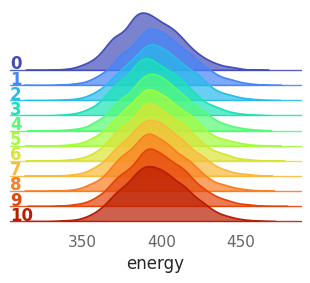

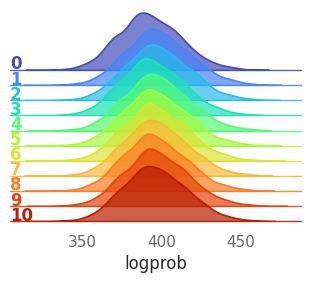

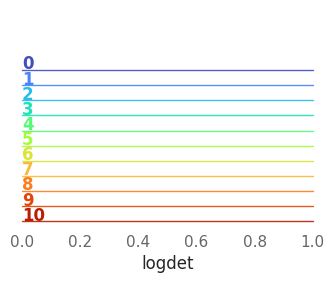

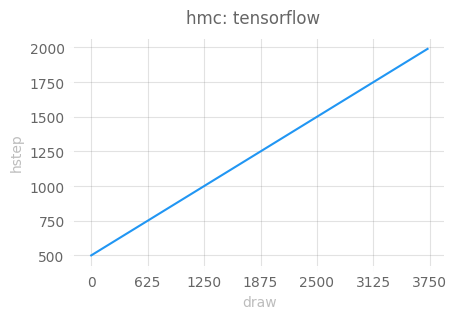

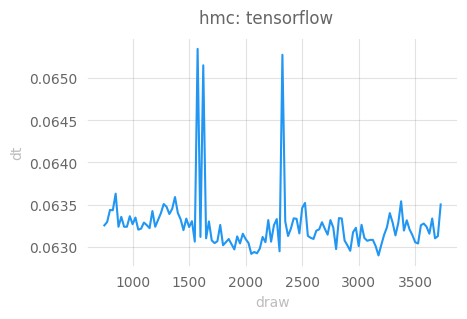

...

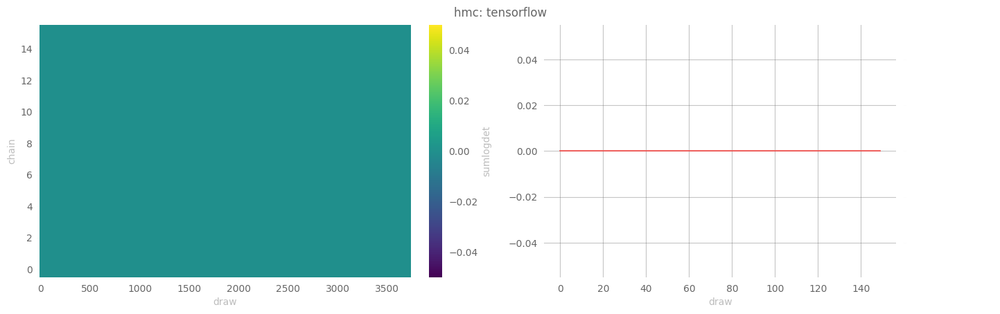

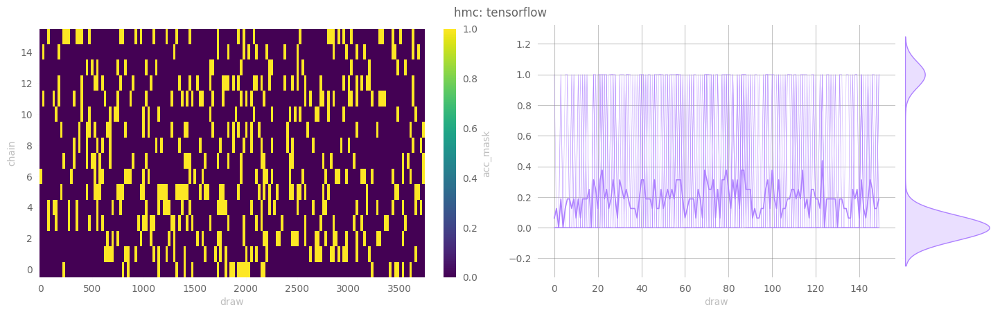

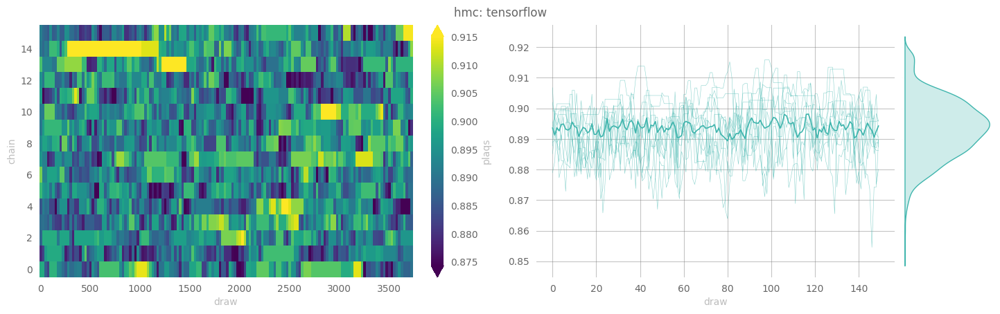

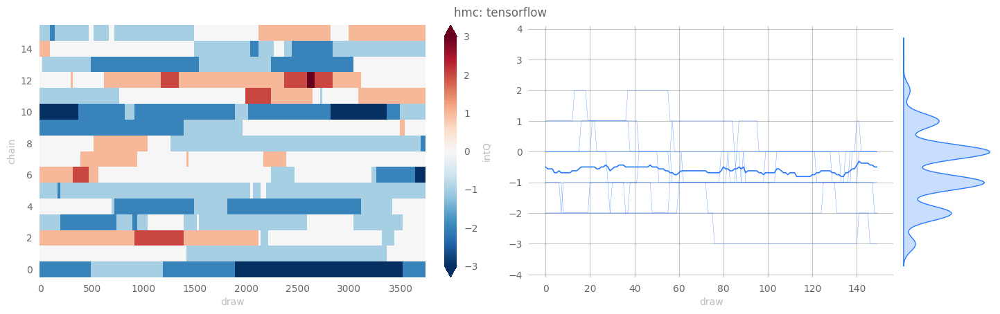

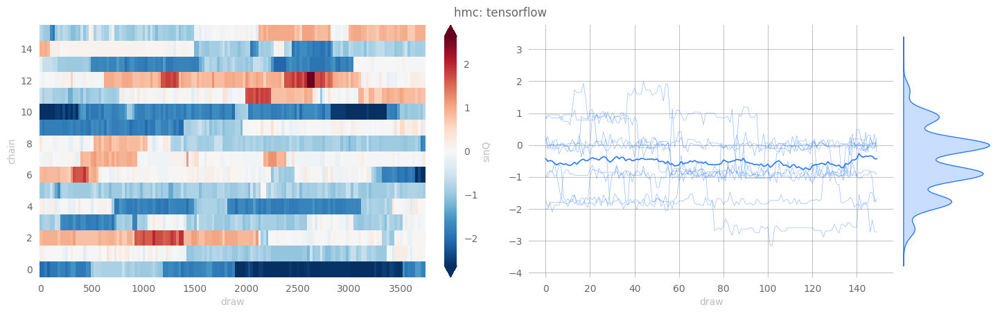

In [32]:
outputs['tensorflow']['hmc'] = tfExpU1.evaluate(job_type='hmc', nchains=16, therm_frac=0.25)

In [34]:
frameworks = {'pt', 'tf'}
modes = {'train', 'eval', 'hmc'}
dsets = {}
for fw in frameworks:
    dsets[fw] = {}
    for mode in modes:
        hist = None
        if fw == 'pt':
            hist = ptExpU1.trainer.histories.get(mode, None)
        elif fw == 'tf':
            hist = tfExpU1.trainer.histories.get(mode, None)
        if hist is not None:
            log.info(f'Getting dataset for {fw}: {mode}')
            dsets[fw][mode] = hist.get_dataset()

[10/21/22 11:08:46] INFO     Getting dataset for tf: train

                    INFO     Getting dataset for tf: eval

                    INFO     Getting dataset for tf: hmc

                    INFO     Getting dataset for pt: train

                    INFO     Getting dataset for pt: eval

                    INFO     Getting dataset for pt: hmc

In [ ]:
etot = dQint_eval[:, -100:].astype(int).sum()
htot = dQint_hmc[:, -100:].astype(int).sum()

fsize = plt.rcParams['figure.figsize']
figsize = (4. * fsize[0], fsize[1])
fig, ax = plt.subplots(figsize=figsize, ncols=2)
_ = dQint_eval[:, -100:].astype(int).plot(ax=ax[0])
_ = dQint_hmc[:, -100:].astype(int).plot(ax=ax[1])
_ = ax[0].set_title(f'Eval, total: {etot}', fontsize='x-large');
_ = ax[1].set_title(f'HMC, total: {htot}', fontsize='x-large');

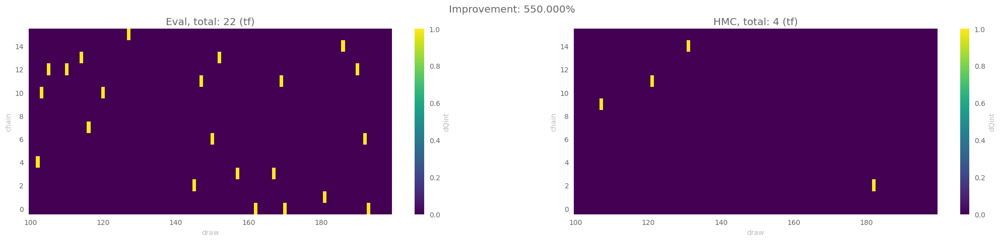

In [36]:
etot = dsets['tf']['eval']['dQint'][:, -100:].astype(int).sum()
htot = dsets['tf']['hmc']['dQint'][:, -100:].astype(int).sum()

fsize = plt.rcParams['figure.figsize']
figsize = (4. * fsize[0], fsize[1])
fig, ax = plt.subplots(figsize=figsize, ncols=2)
_ = dsets['tf']['eval']['dQint'][:, -100:].astype(int).plot(ax=ax[0])
_ = dsets['tf']['hmc']['dQint'][:, -100:].astype(int).plot(ax=ax[1])
_ = ax[0].set_title(f'Eval, total: {etot} (tf)', fontsize='x-large');
_ = ax[1].set_title(f'HMC, total: {htot} (tf)', fontsize='x-large');
_ = fig.suptitle(fr'Improvement: {100*(etot / htot):3.3f}%', fontsize='x-large')

# Comparisons

We can measure our models' performance explicitly by looking at the average tunneling rate, $\delta Q_{\mathbb{Z}}$, for our **trained model** and comparing it against generic HMC.

Recall,

$$\delta Q_{\mathbb{Z}} := \left|Q^{(i+1)}_{\mathbb{Z}} - Q^{(i)}_{\mathbb{Z}}\right|$$

where a **higher** value of $\delta Q_{\mathbb{Z}}$ corresponds to **better** tunneling of the topological charge, $Q_{\mathbb{Z}}$.

In [80]:
log.info(f"tensorflow.eval.dQint.shape: {dsets['tensorflow']['eval'].dQint.shape}")
log.info(f"tensorflow.hmc.dQint.shape: {dsets['tensorflow']['hmc'].dQint.shape}")

[10/20/22 15:07:39] INFO     tensorflow.eval.dQint.shape: (16, 200)

                    INFO     tensorflow.hmc.dQint.shape: (16, 200)

In [81]:
dsets['tensorflow']['eval'].dQint[:64].shape

(16, 200)

In [49]:
dsets['pt']['eval'].keys()

KeysView(<xarray.Dataset>
Dimensions:    (draw: 200, chain: 16, leapfrog: 11)
Coordinates:
  * draw       (draw) int64 0 1 2 3 4 5 6 7 ... 192 193 194 195 196 197 198 199
  * chain      (chain) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15
  * leapfrog   (leapfrog) int64 0 1 2 3 4 5 6 7 8 9 10
Data variables: (12/20)
    estep      (draw) int64 0 10 20 30 40 50 ... 1940 1950 1960 1970 1980 1990
    dt         (draw) float64 0.06792 0.06371 0.06357 ... 0.06041 0.06047
    beta       (draw) float32 5.0 5.0 5.0 5.0 5.0 5.0 ... 5.0 5.0 5.0 5.0 5.0
    loss       (draw) float64 -228.3 0.3089 -8.73 -1.39 ... 17.77 8.742 10.69
    dQsin      (chain, draw) float32 0.6131 0.4301 0.0 0.0 ... 0.0 0.0 0.1903
    dQint      (chain, draw) float32 2.0 1.192e-07 0.0 0.0 ... 0.0 0.0 0.0 0.0
    ...         ...
    acc        (chain, draw) float32 1.0 0.1854 0.5725 ... 0.07019 0.08187 1.0
    sumlogdet  (chain, draw) float32 -0.01743 0.04156 -0.0 ... -0.0 -0.0 0.04137
    acc_mask   (chain, draw) float32 

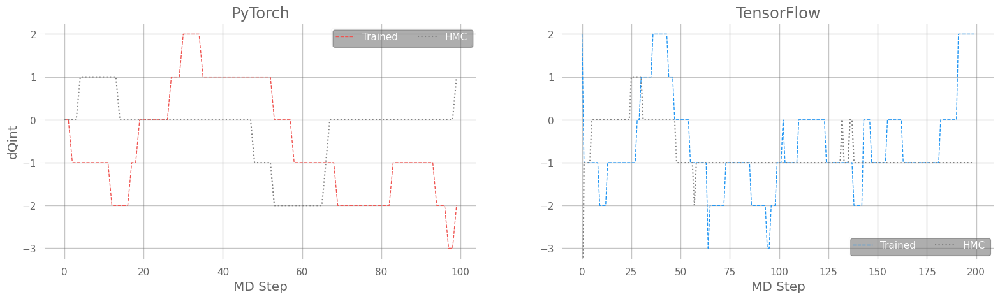

In [58]:
import matplotlib.pyplot as plt
from l2hmc.utils.plot_helpers import set_plot_style, COLORS

import seaborn as sns
set_plot_style()
plt.rcParams['axes.linewidth'] = 2.0
sns.set_context('notebook')
figsize = plt.rcParamsDefault['figure.figsize']
plt.rcParams['figure.dpi'] = plt.rcParamsDefault['figure.dpi']

fig, (ax, ax1) = plt.subplots(
    ncols=2,
    figsize=(3. * figsize[0], figsize[1]),
)
_ = ax.plot(
    dsets['pt']['eval'].intQ[0][100:],  # .dQint.mean('chain')[100:],
    color=COLORS['red'],
    ls='--',
    label='Trained',
    lw=1.,
);
    
_ = ax.plot(
    dsets['pt']['hmc'].intQ[0][100:],  # .dQint.mean('chain')[100:],
    ls=':',
    label='HMC',
    color='#808080',
    zorder=5,
    lw=1.5,
);

_ = ax1.plot(
    dsets['tf']['eval'].intQ[5],  # .dQint.mean('chain')[-100:],
    color=COLORS['blue'],
    ls='--',
    label='Trained',
    lw=1.,
    
);
_ = ax1.plot(
    dsets['tf']['hmc'].intQ[5],  # .dQint.mean('chain')[-100:],
    color='#808080',
    ls=':',
    label='HMC',
    zorder=5,
    lw=1.5,
);
_ = ax.set_title('PyTorch', fontsize='x-large')
_ = ax1.set_title('TensorFlow', fontsize='x-large')
_ = ax1.set_ylim(ax.get_ylim())
_ = ax.grid(True, alpha=0.4)
_ = ax1.grid(True, alpha=0.4)
_ = ax.set_xlabel('MD Step', fontsize='large')
_ = ax1.set_xlabel('MD Step', fontsize='large')
_ = ax.set_ylabel('dQint', fontsize='large')
_ = ax.legend(loc='best', framealpha=0.1, ncol=2, labelcolor='#fff', shadow=True)
_ = ax1.legend(loc='best', framealpha=0.1, ncol=2, labelcolor='#fff', shadow=True)

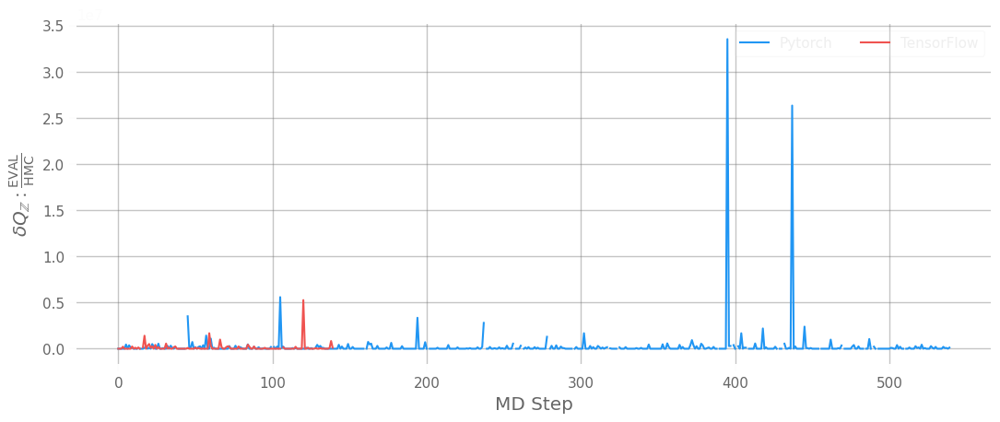

In [83]:
import matplotlib.pyplot as plt
from l2hmc.utils.plot_helpers import set_plot_style, COLORS
set_plot_style()

figsize = plt.rcParams['figure.figsize']
plt.rcParams['axes.linewidth'] = 2.0

# Drop first 10% to account for thermalization
drop = int(0.1 * dsets['pytorch']['eval'].dQint.shape[1])


import xarray as xr
from l2hmc.utils.history import BaseHistory


def plot_dQ_improvement(
        data: dict[str, xr.Dataset],
        drop_percent: float = 0.1,
        fig: Optional[plt.Figure] = None,
        ax: Optional[plt.Axes] = None,
        xlabel: Optional[str] = None,
        ylabel: Optional[str] = None,
        title: Optional[str] = None,
        **kwargs,
) -> tuple[plt.Figure, plt.Axes]:
    assert (
        'eval' in data.keys()
        and 'hmc' in data.keys()
    )
    fig = plt.gcf() if fig is None else fig
    ax = plt.gca() if ax is None else ax
    if fig is None or ax is None:
        fig, ax = plt.subplots()
        
    dQint_eval = data['eval'].dQint
    dQint_hmc = data['hmc'].dQint
    improvement = (
        data['eval'].dQint[:,]
    )
        
        
set_plot_style()
plt.rcParams['axes.linewidth'] = 2.0
sns.set_context('notebook')
figsize = plt.rcParamsDefault['figure.figsize']
plt.rcParams['figure.dpi'] = plt.rcParamsDefault['figure.dpi']
        


fig, ax = plt.subplots(
    #ncols=2,
    figsize=(2. * figsize[0], figsize[1]),
)

dQpt = (
    dsets['pytorch']['eval'].dQint[:, drop:].mean('chain') 
    / dsets['pytorch']['hmc'].dQint[:, drop:].mean('chain')
)
dQtf = (
    dsets['tensorflow']['eval'].dQint[:, drop:].mean('chain') 
    / dsets['tensorflow']['hmc'].dQint[:, drop:].mean('chain')
)
_ = ax.plot(dQpt[::1], color=COLORS['blue'], label='Pytorch');
_ = ax.plot(dQtf[::1], color=COLORS['red'], label='TensorFlow');
ylabel = r'$\delta Q_{\mathbb{Z}}: \frac{\mathrm{EVAL}}{\mathrm{HMC}}$'
_ = ax.set_xlabel('MD Step', fontsize='large');
#_ = ax.set_yscale('log');
_ = ax.set_ylabel(ylabel, fontsize='large')
_ = ax.legend(loc='best', framealpha=0.1, ncol=2, labelcolor='#EFEFEF')#, shadow=True);#, textcolor='#EFEFEF');
_ = ax.grid(True, which='both', alpha=0.4);

# $SU(3)$

In [ ]:
ptExpSU3 = get_experiment(
    overrides=[
        *defaults_su3,
        'framework=pytorch',
    ]
)

In [ ]:
tfExpU1 = get_experiment(
    overrides=[
        *defaults_u1,
        'framework=tensorflow',
    ]
)

tfExpSU3 = get_experiment(
    overrides=[
        *defaults_su3,
        'framework=tensorflow',
    ]
)

tfObjsU1 = tfExpU1.build(init_wandb=False, init_aim=True)
tfObjsSU3 = tfExpSU3.build(init_wandb=False, init_aim=True)